### PROJECT TITLE : DS AMAZON MUSIC CLUSTERING PROJECT

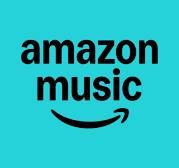

### Importing libraries 

In [65]:
#Importing basic libraries
import numpy as np
import pandas as pd
#Importing visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from mpl_toolkits.mplot3d import Axes3D
from pandas.plotting import parallel_coordinates

In [66]:
# Importing encoders, scalers libraries
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MinMaxScaler

In [67]:
#Importing pipeline libraries
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split

In [68]:
# Importing clustering algorithms from sklearn
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from sklearn.neighbors import NearestNeighbors
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics.pairwise import cosine_similarity
from scipy import stats

In [69]:
# Importing metrics and dimensionality reduction techniques
from sklearn.metrics import silhouette_score
from sklearn.metrics import davies_bouldin_score
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

### Data loading

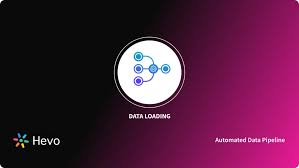

In [70]:
music_df = pd.read_csv(r'C:\Users\sathishkumar\Downloads\Amazon_music_clusturing\Data\single_genre_artists (1).csv')
music_df.head()

,id_songs,name_song,popularity_songs,duration_ms,explicit,id_artists,release_date,danceability,energy,key,...,acousticness,instrumentalness,liveness,valence,tempo,time_signature,followers,genres,name_artists,popularity_artists
0,0IA0Hju8CAgYfV1hwhidBH,La Java,0,161427,0,4AxgXfD7ISvJSTObqm4aIE,1922,0.563,0.184,4,...,0.993,0.000016,0.325,0.654,133.088,3,5078.0,['vintage chanson'],Mistinguett,22
1,1b8HZQCqcqwbzlA1jRTp6E,En Douce,0,223440,0,4AxgXfD7ISvJSTObqm4aIE,1922,0.427,0.180,10,...,0.989,0.000000,0.128,0.431,78.459,3,5078.0,['vintage chanson'],Mistinguett,22
2,5d5gQxHwYovxR5pqETOIAa,J'en Ai Marre,0,208267,0,4AxgXfD7ISvJSTObqm4aIE,1922,0.511,0.206,0,...,0.995,0.000000,0.418,0.481,70.443,4,5078.0,['vintage chanson'],Mistinguett,22
3,1EO65UEEPfy7CR0NK2sDxy,Ils n'ont pas ca,0,161933,0,4AxgXfD7ISvJSTObqm4aIE,1924,0.676,0.467,9,...,0.991,0.000000,0.219,0.726,129.775,4,5078.0,['vintage chanson'],Mistinguett,22
4,6a58gXSgqbIsXUhVZ6ZJqe,La belote,0,167973,0,4AxgXfD7ISvJSTObqm4aIE,1924,0.650,0.298,9,...,0.991,0.000000,0.373,0.844,75.950,4,5078.0,['vintage chanson'],Mistinguett,22


### Data overview

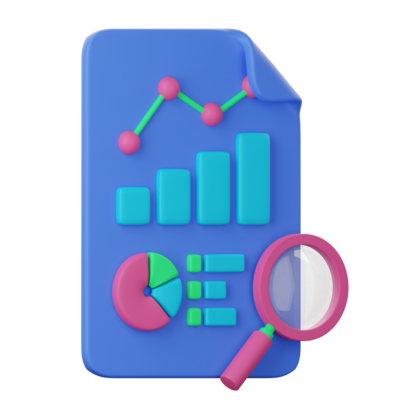

♥ Dataset Name: Amazon Music Clustering

♥ Source: Amazon music platform

♥ Data Format: CSV file

♥ Number of Records (Rows): 95,837

♥ Number of Features (Columns): 23

♥ Feature Types:
   ♦ 7 categorical (object/string)
   ♦ 12 numerical (float)
   ♦ 4 numerical (integer)

♥ Columns in Dataset:

1 id_songs – Unique identifier of each song

2 name_song – Name/title of the track

3 popularity_songs – Popularity score of the song (0–100)

4 duration_ms – Duration of the track in milliseconds

5 explicit – Explicit content flag (0 = No, 1 = Yes)

6 id_artists – Unique identifier of the artist(s)

7 release_date – Release date of the track

8 danceability – Danceability score (0.0 to 1.0)

9 energy – Energy/intensity of the track

10 key – Musical key of the song (0–11)

11 loudness – Overall loudness in decibels (dB)

12 mode – Modality of the song (major = 1, minor = 0)

13 speechiness – Presence of spoken words in the track

14 acousticness – Acoustic quality score

15 instrumentalness – Likelihood of being instrumental

16 liveness – Probability of live performance

17 valence – Musical positiveness/mood score

18 tempo – Tempo of the track in BPM (beats per minute)

19 time_signature – Time signature (beats per bar)

20 followers – Number of followers of the artist(s)

21 genres – Genre(s) associated with the artist(s)

22 name_artists – Name(s) of the artist(s)

23 popularity_artists – Popularity score of the artist(s)

♥ Timeframe Covered: Songs range from early 20th-century releases (1920s) to modern tracks (up to 2020).

♥ Brief Description:
This dataset captures a wide spectrum of audio features, popularity metrics, and artist metadata for Amazon Music/Spotify-like tracks. It combines song-level attributes (e.g., duration, danceability, energy, valence, tempo, loudness, mode), artist-level characteristics (followers, genres, popularity), and contextual data (release date, explicit flag). It is designed to support exploratory analysis, clustering, and recommendation modeling, making it ideal for studying music similarity, genre trends, artist influence on popularity, and playlist generation.

### Data Exploration

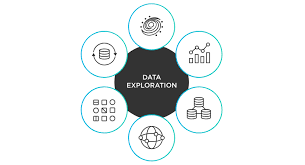

In [71]:
# first 5 rows of the data
music_df.head()

,id_songs,name_song,popularity_songs,duration_ms,explicit,id_artists,release_date,danceability,energy,key,...,acousticness,instrumentalness,liveness,valence,tempo,time_signature,followers,genres,name_artists,popularity_artists
0,0IA0Hju8CAgYfV1hwhidBH,La Java,0,161427,0,4AxgXfD7ISvJSTObqm4aIE,1922,0.563,0.184,4,...,0.993,0.000016,0.325,0.654,133.088,3,5078.0,['vintage chanson'],Mistinguett,22
1,1b8HZQCqcqwbzlA1jRTp6E,En Douce,0,223440,0,4AxgXfD7ISvJSTObqm4aIE,1922,0.427,0.180,10,...,0.989,0.000000,0.128,0.431,78.459,3,5078.0,['vintage chanson'],Mistinguett,22
2,5d5gQxHwYovxR5pqETOIAa,J'en Ai Marre,0,208267,0,4AxgXfD7ISvJSTObqm4aIE,1922,0.511,0.206,0,...,0.995,0.000000,0.418,0.481,70.443,4,5078.0,['vintage chanson'],Mistinguett,22
3,1EO65UEEPfy7CR0NK2sDxy,Ils n'ont pas ca,0,161933,0,4AxgXfD7ISvJSTObqm4aIE,1924,0.676,0.467,9,...,0.991,0.000000,0.219,0.726,129.775,4,5078.0,['vintage chanson'],Mistinguett,22
4,6a58gXSgqbIsXUhVZ6ZJqe,La belote,0,167973,0,4AxgXfD7ISvJSTObqm4aIE,1924,0.650,0.298,9,...,0.991,0.000000,0.373,0.844,75.950,4,5078.0,['vintage chanson'],Mistinguett,22


In [72]:
# last 5 rows of the data
music_df.tail()

,id_songs,name_song,popularity_songs,duration_ms,explicit,id_artists,release_date,danceability,energy,key,...,acousticness,instrumentalness,liveness,valence,tempo,time_signature,followers,genres,name_artists,popularity_artists
95832,44r4zta6P9flkhKaVnbsvG,Freaks,70,174800,0,14Y3trk7LaslSFTk1G35rx,2019-02-25,0.674,0.5680,1,...,0.116,0.000,0.1650,0.640,166.107,4,16057.0,['alt z'],Jordan Clarke,56
95833,0MmaEacabpK8Yp3Mdeo5uY,下雨天,50,265846,0,5VGgFE9nPgMfEnYiPT5J2B,2020-02-25,0.528,0.6730,4,...,0.143,0.000,0.0989,0.297,130.066,4,929.0,['chinese viral pop'],芝麻,36
95834,1dKxf4Ht2SsKLyXfSDJAgy,The Cutest Puppy,67,82500,0,7vgGpuiXdNlCmc994PlMlz,2020-10-30,0.609,0.0172,8,...,0.996,0.973,0.1080,0.890,68.619,4,23.0,['instrumental lullaby'],Laureen Conrad,52
95835,0SjsIzJkZfDU7wlcdklEFR,John Brown's Song,66,185250,0,4MxqhahGRT4BPz1PilXGeu,2020-03-20,0.562,0.0331,1,...,0.996,0.961,0.1110,0.386,63.696,3,91.0,['instrumental lullaby'],Gregory Oberle,55
95836,5rgu12WBIHQtvej2MdHSH0,云与海,50,258267,0,1QLBXKM5GCpyQQSVMNZqrZ,2020-09-26,0.560,0.5180,0,...,0.785,0.000,0.0648,0.211,131.896,4,896.0,['chinese viral pop'],阿YueYue,38


In [73]:
# looking the shape of the data
music_df.shape
print(f'The dataset contains {music_df.shape[0]} rows and {music_df.shape[1]} columns.')

The dataset contains 95837 rows and 23 columns.


In [74]:
# Getting the information about the data
music_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 95837 entries, 0 to 95836
Data columns (total 23 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   id_songs            95837 non-null  object 
 1   name_song           95837 non-null  object 
 2   popularity_songs    95837 non-null  int64  
 3   duration_ms         95837 non-null  int64  
 4   explicit            95837 non-null  int64  
 5   id_artists          95837 non-null  object 
 6   release_date        95837 non-null  object 
 7   danceability        95837 non-null  float64
 8   energy              95837 non-null  float64
 9   key                 95837 non-null  int64  
 10  loudness            95837 non-null  float64
 11  mode                95837 non-null  int64  
 12  speechiness         95837 non-null  float64
 13  acousticness        95837 non-null  float64
 14  instrumentalness    95837 non-null  float64
 15  liveness            95837 non-null  float64
 16  vale

In [75]:
# Statistical summary of the numerical data
music_df.describe()

,popularity_songs,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,followers,popularity_artists
count,95837.000000,9.583700e+04,95837.000000,95837.000000,95837.000000,95837.000000,95837.000000,95837.000000,95837.000000,95837.000000,95837.000000,95837.000000,95837.000000,95837.000000,95837.000000,9.583700e+04,95837.000000
mean,26.066394,2.087320e+05,0.029644,0.586853,0.541083,5.196782,-10.157862,0.648069,0.168832,0.458989,0.082145,0.224916,0.574281,117.539870,3.851362,1.979919e+05,42.819329
std,16.254133,1.177526e+05,0.169604,0.155422,0.236304,3.534923,4.748798,0.477575,0.275417,0.330416,0.232440,0.185829,0.248126,30.190399,0.544406,7.807520e+05,20.897833
min,0.000000,6.373000e+03,0.000000,0.000000,0.000020,0.000000,-50.174000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000
25%,13.000000,1.573330e+05,0.000000,0.488000,0.365000,2.000000,-12.723000,0.000000,0.034100,0.133000,0.000000,0.100000,0.378000,94.829000,4.000000,2.563000e+03,28.000000
50%,26.000000,2.040000e+05,0.000000,0.605000,0.542000,5.000000,-9.397000,1.000000,0.046200,0.453000,0.000004,0.149000,0.589000,116.595000,4.000000,1.595600e+04,40.000000
75%,37.000000,2.502670e+05,0.000000,0.700000,0.727000,8.000000,-6.692000,1.000000,0.103000,0.759000,0.001300,0.302000,0.780000,135.975000,4.000000,8.495100e+04,56.000000
max,98.000000,4.800118e+06,1.000000,0.991000,1.000000,11.000000,5.376000,1.000000,0.968000,0.996000,1.000000,0.997000,1.000000,239.906000,5.000000,2.802643e+07,95.000000


In [76]:
# Statistical summary of categorical columns
music_df.describe(include='object')

,id_songs,name_song,id_artists,release_date,genres,name_artists
count,95837,95837,95837,95837,95837,95837
unique,95837,85427,18009,10436,3153,17662
top,0IA0Hju8CAgYfV1hwhidBH,Bibi Blocksberg Lied,3meJIgRw7YleJrmbpbJK6S,1983,['hoerspiel'],Die drei ???
freq,1,33,3856,754,8027,3856


In [77]:
#cheking for duplicated datas
music_df.duplicated().sum()
print(f'The dataset contains {music_df.duplicated().sum()} duplicated rows.')

The dataset contains 0 duplicated rows.


In [78]:
# Checking for missing values
music_df.isnull().sum()
print(f'The dataset contains {music_df.isnull().sum().sum()} missing values.')

The dataset contains 0 missing values.


In [79]:
# Checking the data types of each column
music_df.dtypes

id_songs               object
name_song              object
popularity_songs        int64
duration_ms             int64
explicit                int64
id_artists             object
release_date           object
danceability          float64
energy                float64
key                     int64
loudness              float64
mode                    int64
speechiness           float64
acousticness          float64
instrumentalness      float64
liveness              float64
valence               float64
tempo                 float64
time_signature          int64
followers             float64
genres                 object
name_artists           object
popularity_artists      int64
dtype: object

In [80]:
# Checking the unique values in each column
music_df.nunique()

id_songs              95837
name_song             85427
popularity_songs         94
duration_ms           44685
explicit                  2
id_artists            18009
release_date          10436
danceability            996
energy                 1928
key                      12
loudness              19919
mode                      2
speechiness            1648
acousticness           3946
instrumentalness       5356
liveness               1713
valence                1595
tempo                 58312
time_signature            5
followers             11585
genres                 3153
name_artists          17662
popularity_artists       93
dtype: int64

### Data Cleaning 

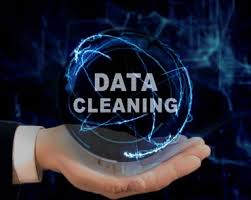

In [ ]:
# Data cleaning and feature selection
def clean_data(music_df):
    """
    Cleaning the dataset by:
    - Converting release_date to datetime
    - Dropping unnecessary columns
    - Keeping only features needed for clustering
    """
    
    # Converting release_date to datetime (if present)
    if 'release_date' in music_df.columns:
        music_df['release_date'] = pd.to_datetime(music_df['release_date'], errors='coerce')

    # Defining features required for clustering
    clustering_features = [
        "danceability", "energy", "loudness", "speechiness",
        "acousticness", "instrumentalness", "liveness",
        "valence", "tempo", "duration_ms",
    ]

    # Keep only relevant features (drop everything else)
    music_df = music_df[[col for col in clustering_features if col in music_df.columns]]

    return music_df


# Calling function
music_df = clean_data(music_df)

music_df


,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,0.563,0.1840,-13.757,0.0512,0.993,0.000016,0.3250,0.654,133.088,161427
1,0.427,0.1800,-15.375,0.0670,0.989,0.000000,0.1280,0.431,78.459,223440
2,0.511,0.2060,-15.514,0.0592,0.995,0.000000,0.4180,0.481,70.443,208267
3,0.676,0.4670,-12.393,0.1650,0.991,0.000000,0.2190,0.726,129.775,161933
4,0.650,0.2980,-13.806,0.1380,0.991,0.000000,0.3730,0.844,75.950,167973
...,...,...,...,...,...,...,...,...,...,...
95832,0.674,0.5680,-6.356,0.0408,0.116,0.000000,0.1650,0.640,166.107,174800
95833,0.528,0.6730,-3.639,0.0314,0.143,0.000000,0.0989,0.297,130.066,265846
95834,0.609,0.0172,-28.573,0.1180,0.996,0.973000,0.1080,0.890,68.619,82500
95835,0.562,0.0331,-25.551,0.1030,0.996,0.961000,0.1110,0.386,63.696,185250


### Exploratory Data Analysis


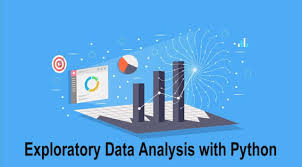

#### Univariate Analysis


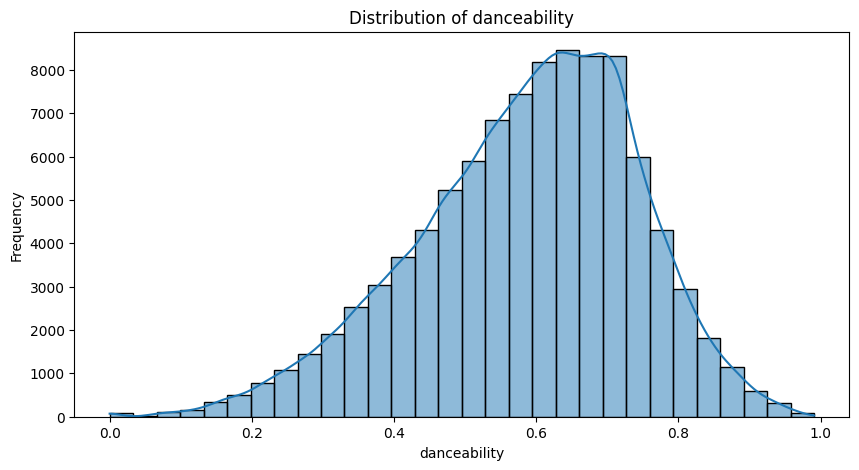


 Insights for 'danceability':
count    95837.000000
mean         0.586853
std          0.155422
min          0.000000
25%          0.488000
50%          0.605000
75%          0.700000
max          0.991000
Name: danceability, dtype: float64
➡ Approximately normal distribution.
------------------------------------------------------------


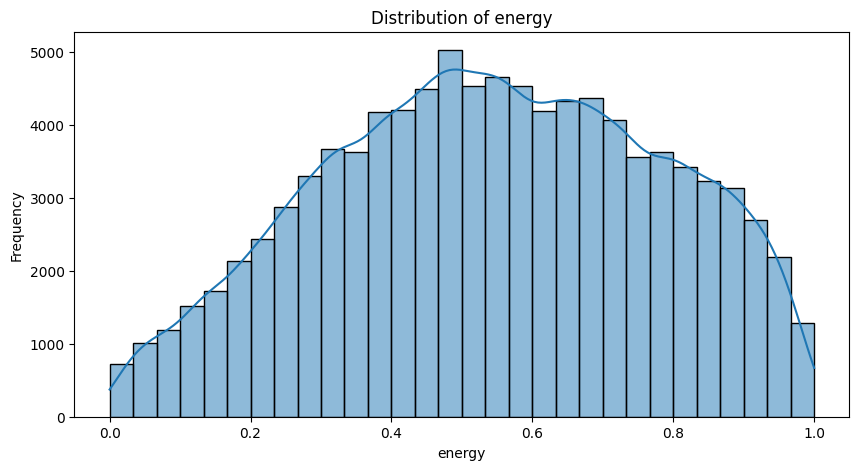


 Insights for 'energy':
count    95837.000000
mean         0.541083
std          0.236304
min          0.000020
25%          0.365000
50%          0.542000
75%          0.727000
max          1.000000
Name: energy, dtype: float64
➡ Approximately normal distribution.
------------------------------------------------------------


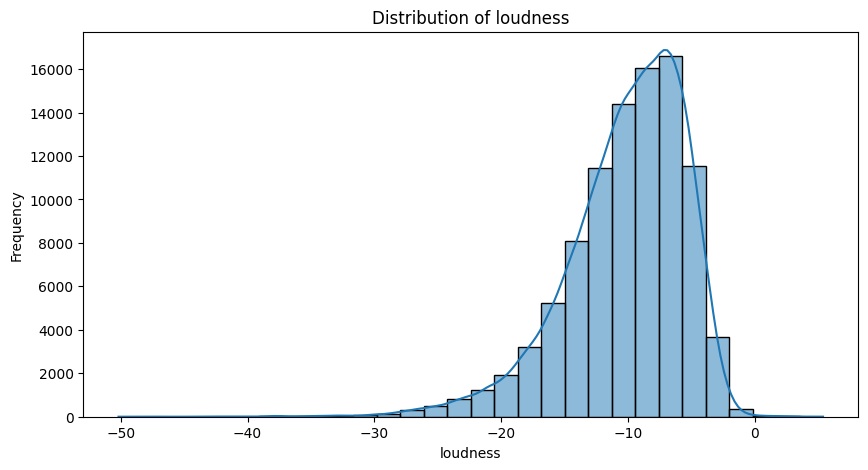


 Insights for 'loudness':
count    95837.000000
mean       -10.157862
std          4.748798
min        -50.174000
25%        -12.723000
50%         -9.397000
75%         -6.692000
max          5.376000
Name: loudness, dtype: float64
➡ Left-skewed distribution (long tail on the left).
------------------------------------------------------------


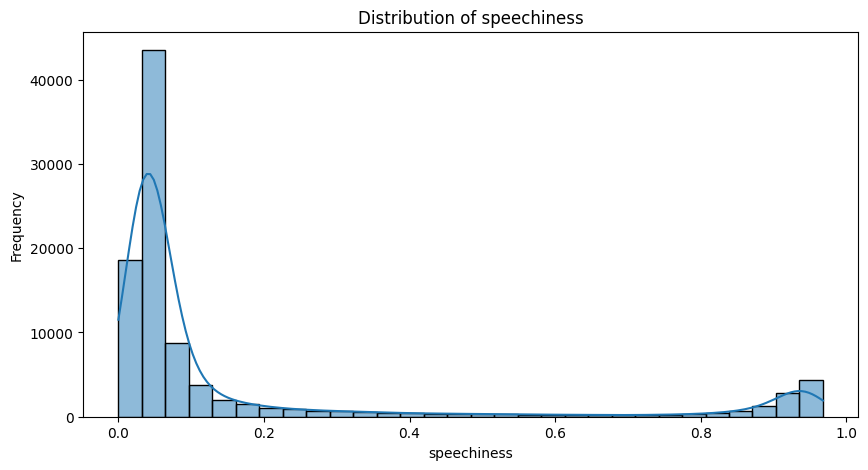


 Insights for 'speechiness':
count    95837.000000
mean         0.168832
std          0.275417
min          0.000000
25%          0.034100
50%          0.046200
75%          0.103000
max          0.968000
Name: speechiness, dtype: float64
➡ Right-skewed distribution (long tail on the right).
------------------------------------------------------------


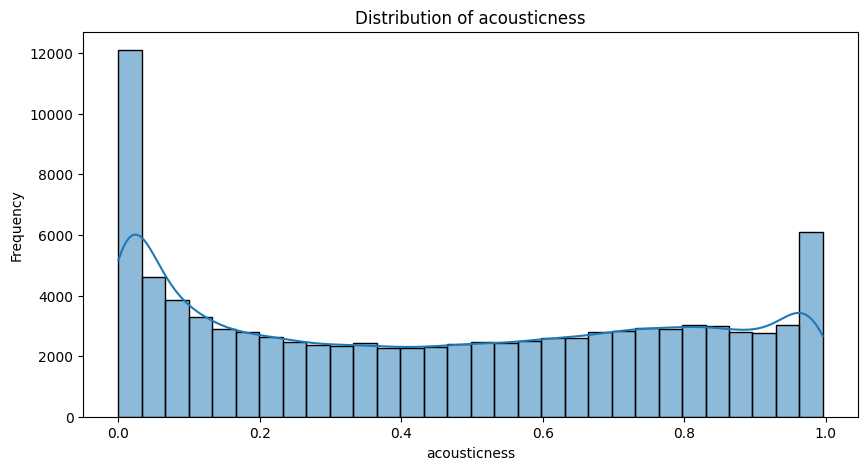


 Insights for 'acousticness':
count    95837.000000
mean         0.458989
std          0.330416
min          0.000000
25%          0.133000
50%          0.453000
75%          0.759000
max          0.996000
Name: acousticness, dtype: float64
➡ Approximately normal distribution.
------------------------------------------------------------


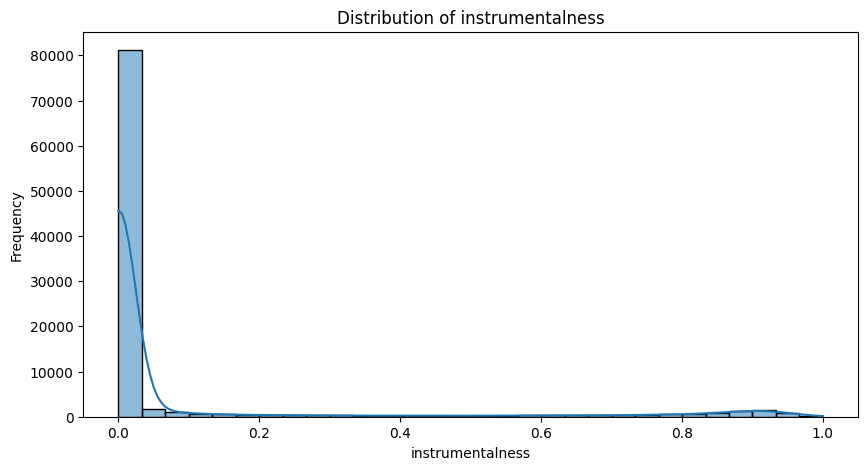


 Insights for 'instrumentalness':
count    95837.000000
mean         0.082145
std          0.232440
min          0.000000
25%          0.000000
50%          0.000004
75%          0.001300
max          1.000000
Name: instrumentalness, dtype: float64
➡ Right-skewed distribution (long tail on the right).
------------------------------------------------------------


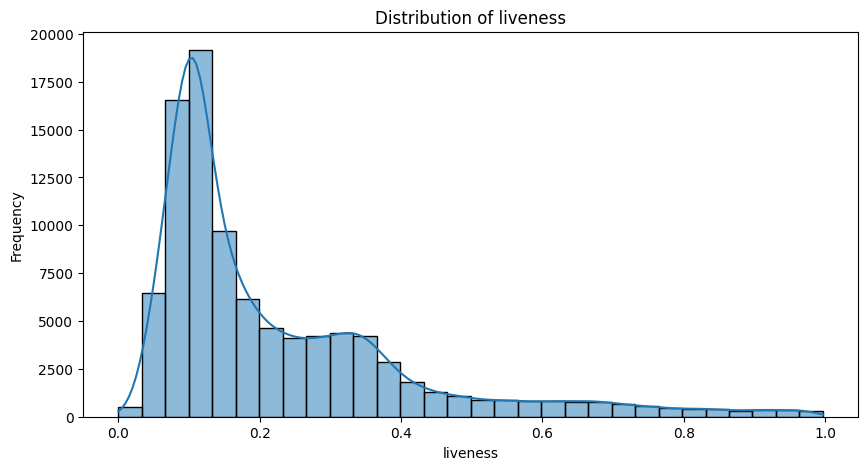


 Insights for 'liveness':
count    95837.000000
mean         0.224916
std          0.185829
min          0.000000
25%          0.100000
50%          0.149000
75%          0.302000
max          0.997000
Name: liveness, dtype: float64
➡ Right-skewed distribution (long tail on the right).
------------------------------------------------------------


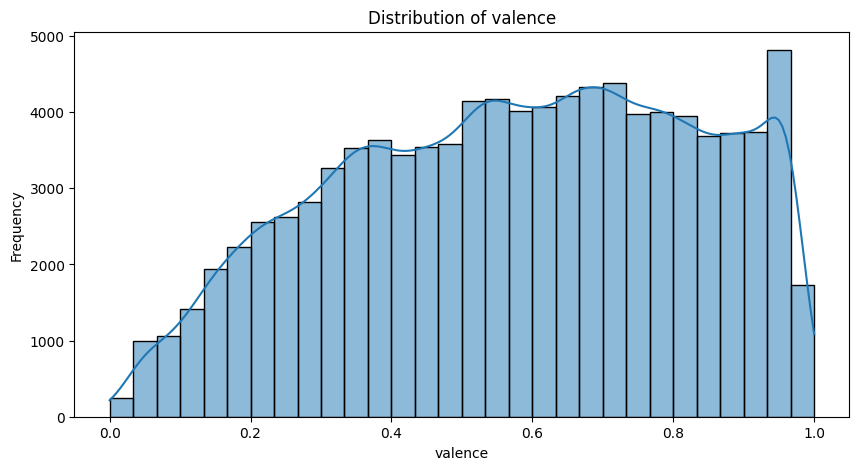


 Insights for 'valence':
count    95837.000000
mean         0.574281
std          0.248126
min          0.000000
25%          0.378000
50%          0.589000
75%          0.780000
max          1.000000
Name: valence, dtype: float64
➡ Approximately normal distribution.
------------------------------------------------------------


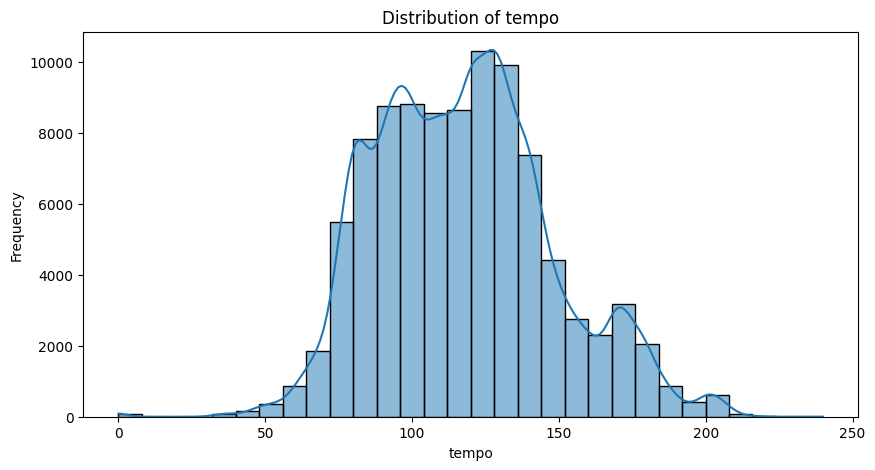


 Insights for 'tempo':
count    95837.000000
mean       117.539870
std         30.190399
min          0.000000
25%         94.829000
50%        116.595000
75%        135.975000
max        239.906000
Name: tempo, dtype: float64
➡ Approximately normal distribution.
------------------------------------------------------------


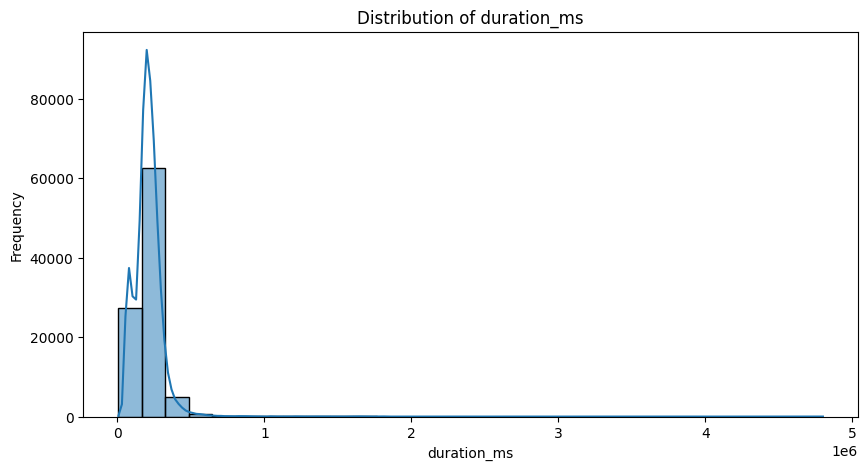


 Insights for 'duration_ms':
count    9.583700e+04
mean     2.087320e+05
std      1.177526e+05
min      6.373000e+03
25%      1.573330e+05
50%      2.040000e+05
75%      2.502670e+05
max      4.800118e+06
Name: duration_ms, dtype: float64
➡ Right-skewed distribution (long tail on the right).
------------------------------------------------------------

 Univariate analysis completed.


In [82]:
# Univariate analysis
def univariate_analysis(music_df):
    numeric_cols = music_df.select_dtypes(include=['int64', 'float64']).columns
    categorical_cols = music_df.select_dtypes(include=['object', 'category']).columns

    # Histograms for numerical columns
    for col in numeric_cols:
        plt.figure(figsize=(10, 5))
        sns.histplot(music_df[col].dropna(), kde=True, bins=30)
        plt.title(f'Distribution of {col}')
        plt.xlabel(col)
        plt.ylabel("Frequency")
        plt.show()

        # Summary statistics
        print(f"\n Insights for '{col}':")
        print(music_df[col].describe())
        if music_df[col].skew() > 1:
            print("➡ Right-skewed distribution (long tail on the right).")
        elif music_df[col].skew() < -1:
            print("➡ Left-skewed distribution (long tail on the left).")
        else:
            print("➡ Approximately normal distribution.")
        print("-" * 60)

    # Bar plots for categorical columns
    for col in categorical_cols:
        plt.figure(figsize=(10, 5))
        music_df[col].value_counts().head(20).plot(kind="bar")
        plt.title(f"Value Counts of {col} (Top 20)")
        plt.xlabel(col)
        plt.ylabel("Counts")
        plt.show()

        print(f"\n Insights for '{col}':")
        print(music_df[col].value_counts().head(10))
        if music_df[col].nunique() > 20:
            print(f"➡ {col} has {music_df[col].nunique()} unique categories (only top 20 shown).")
        else:
            print(f"➡ {col} has {music_df[col].nunique()} unique categories in total.")
        print("-" * 60)

    print("\n Univariate analysis completed.")
univariate_analysis(music_df)

### Bivariate analysis

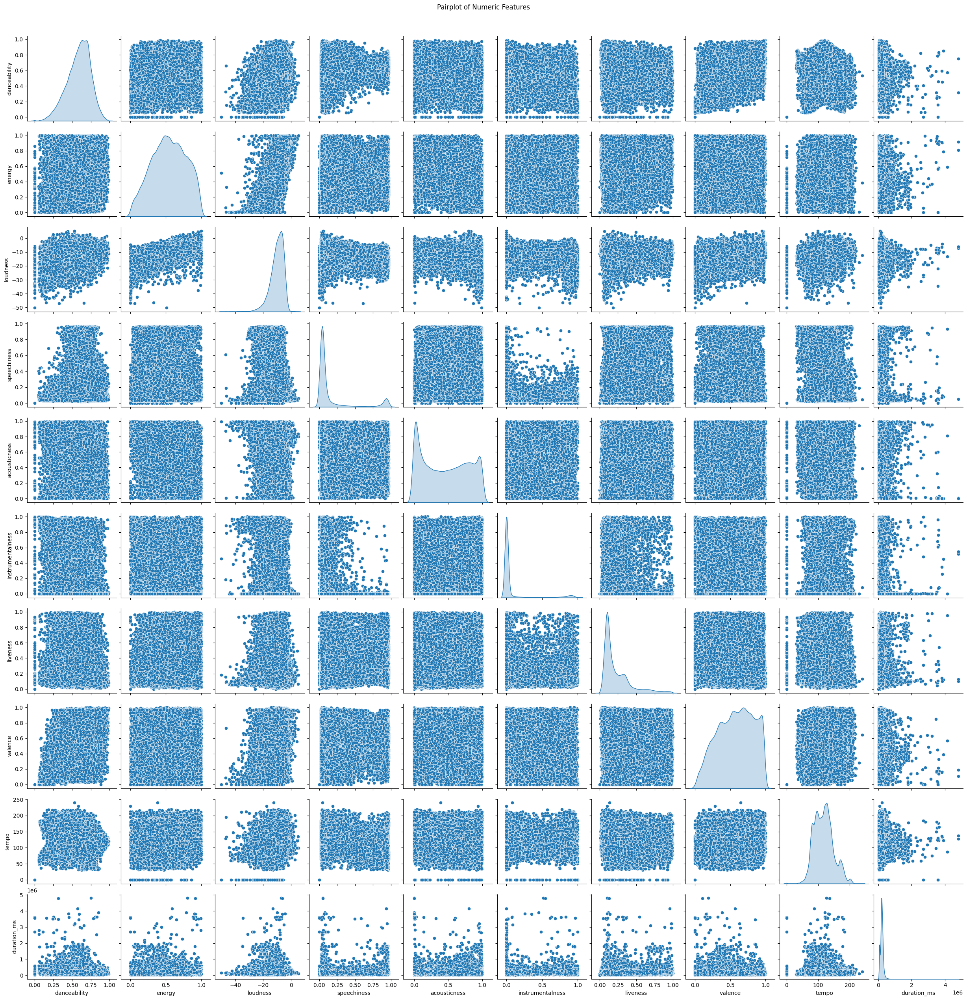

 Insight: Pairplot shows how numeric features relate with each other.
  - Look for linear trends (positive/negative correlation).
  - Wide scatter = weak relation, narrow = strong relation.



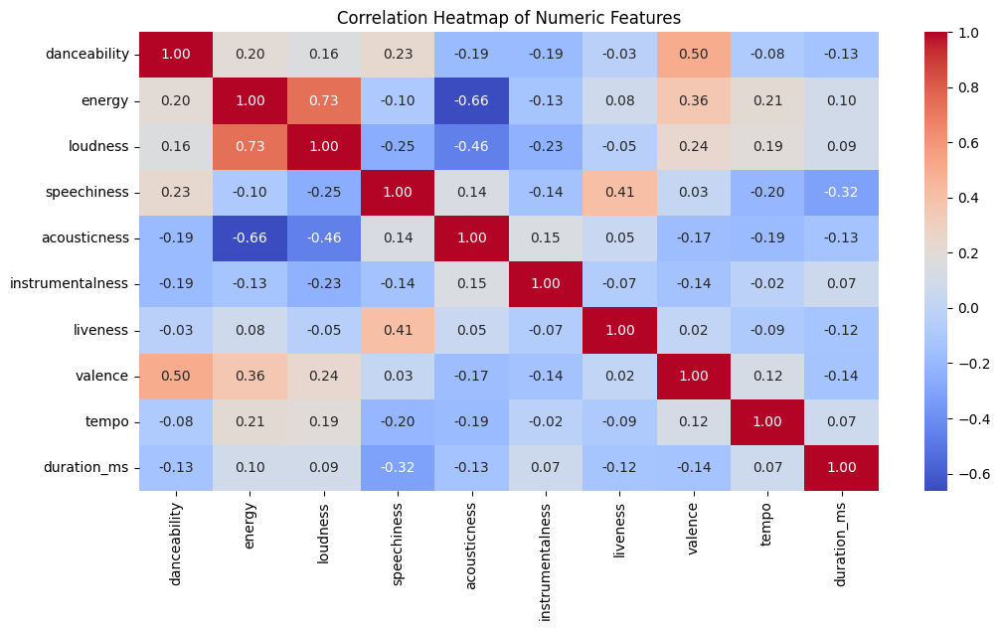

 Insight: Correlation heatmap highlights feature relationships.
  - Values close to +1 → strong positive correlation.
  - Values close to -1 → strong negative correlation.
  - Values near 0 → weak or no correlation.


 Bivariate analysis with insights completed.


In [83]:
# Bivariate analysis
def bivariate_analysis(music_df):
    numeric_cols = music_df.select_dtypes(include=['int64', 'float64']).columns
    categorical_cols = music_df.select_dtypes(include=['object', 'category']).columns

    # Scatter plots (pairplot)
    if len(numeric_cols) > 1:
        sns.pairplot(music_df[numeric_cols].dropna(), diag_kind="kde")
        plt.suptitle("Pairplot of Numeric Features", y=1.02)
        plt.show()
        print(" Insight: Pairplot shows how numeric features relate with each other.\n"
              "  - Look for linear trends (positive/negative correlation).\n"
              "  - Wide scatter = weak relation, narrow = strong relation.\n")

    # Correlation heatmap
    if len(numeric_cols) > 1:
        plt.figure(figsize=(12, 6))
        corr = music_df[numeric_cols].corr()
        sns.heatmap(corr, annot=True, cmap="coolwarm", fmt=".2f")
        plt.title("Correlation Heatmap of Numeric Features")
        plt.show()
        print(" Insight: Correlation heatmap highlights feature relationships.\n"
              "  - Values close to +1 → strong positive correlation.\n"
              "  - Values close to -1 → strong negative correlation.\n"
              "  - Values near 0 → weak or no correlation.\n")

    # Relationships between categorical & numeric
    for cat in categorical_cols:
        for num in numeric_cols:
            plt.figure(figsize=(10, 5))
            sns.boxplot(x=cat, y=num, data=music_df)
            plt.title(f"{num} across {cat}")
            plt.xticks(rotation=45)
            plt.show()

            # Generate simple insights
            group_stats = music_df.groupby(cat)[num].mean().sort_values()
            top_cat = group_stats.idxmax()
            bottom_cat = group_stats.idxmin()
            print(f" Insight: {num} varies across {cat}.\n"
                  f"  - Highest average {num} in: {top_cat} ({group_stats.max():.2f})\n"
                  f"  - Lowest average {num} in: {bottom_cat} ({group_stats.min():.2f})\n"
                  f"  - Spread shows variability in distribution across groups.\n")

    print("\n Bivariate analysis with insights completed.")
bivariate_analysis(music_df)    

### Multivariate Analysis

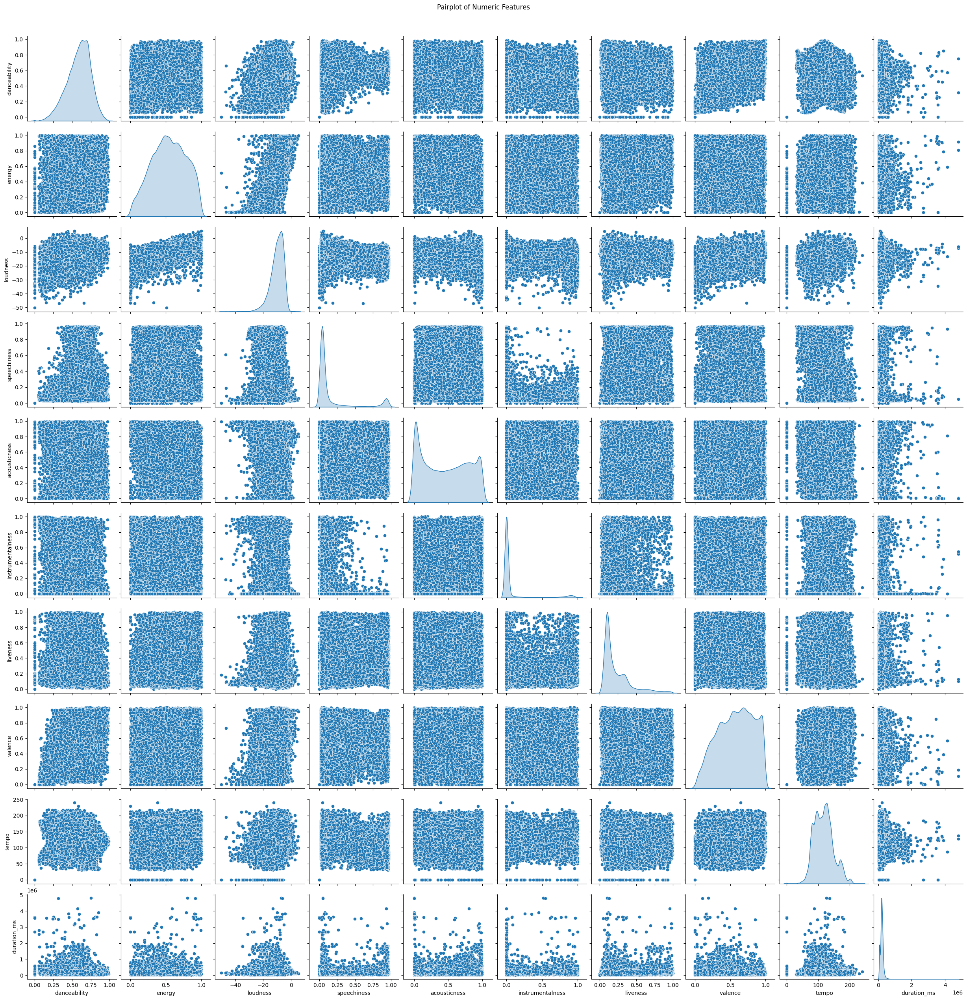

 Insight: Pairplot shows interactions among numeric features.
   - Look for clusters or linear patterns between variables.
   - For example, if 'energy' and 'loudness' form a diagonal band, they are strongly related.



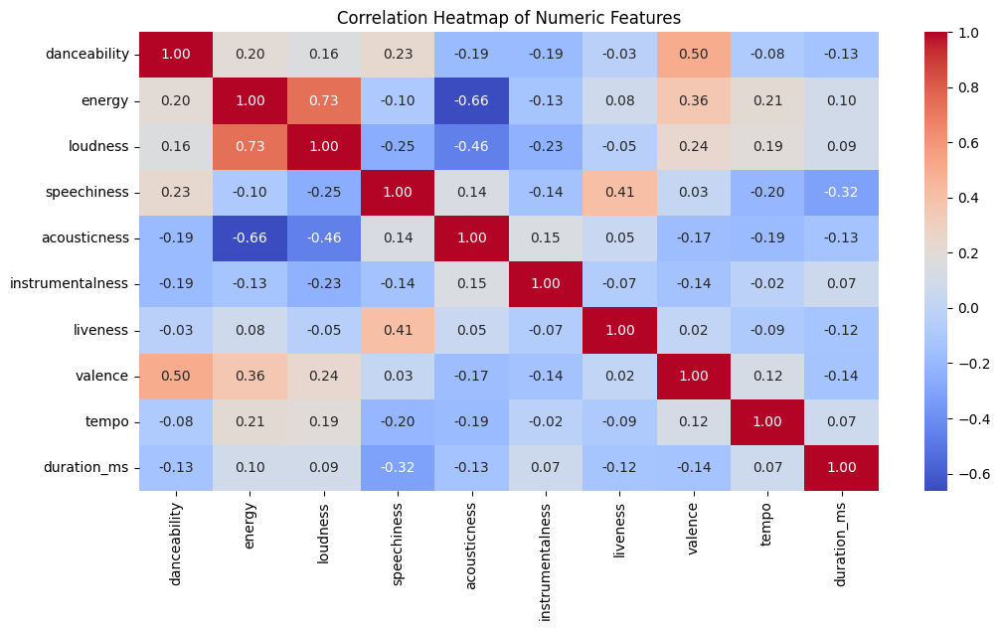

 Insight: Top correlated feature pairs:
   - loudness and energy are positively correlated (corr = 0.73).
   - energy and loudness are positively correlated (corr = 0.73).
   - danceability and valence are positively correlated (corr = 0.50).
   - valence and danceability are positively correlated (corr = 0.50).
   - speechiness and liveness are positively correlated (corr = 0.41).


 Multivariate analysis completed.


In [84]:
# Multivariate analysis
def multivariate_analysis(music_df):
    numeric_cols = music_df.select_dtypes(include=['int64', 'float64']).columns
    categorical_cols = music_df.select_dtypes(include=['object', 'category']).columns

    # ==============================
    # 1. Pairplot for Numeric Features
    # ==============================
    if len(numeric_cols) > 2:
        sns.pairplot(music_df[numeric_cols].dropna(), diag_kind="kde")
        plt.suptitle("Pairplot of Numeric Features", y=1.02)
        plt.show()

        print(" Insight: Pairplot shows interactions among numeric features.\n"
              "   - Look for clusters or linear patterns between variables.\n"
              "   - For example, if 'energy' and 'loudness' form a diagonal band, "
              "they are strongly related.\n")

    # ==============================
    # 2. Correlation Heatmap
    # ==============================
    if len(numeric_cols) > 2:
        plt.figure(figsize=(12, 6))
        corr = music_df[numeric_cols].corr()
        sns.heatmap(corr, annot=True, cmap="coolwarm", fmt=".2f")
        plt.title("Correlation Heatmap of Numeric Features")
        plt.show()

        # Generate automatic insights
        high_corr = (corr.where(~np.eye(corr.shape[0],dtype=bool))
                        .stack()
                        .sort_values(ascending=False)
                        .head(5))
        print(" Insight: Top correlated feature pairs:")
        for (f1, f2), val in high_corr.items():
            relation = "positively" if val > 0 else "negatively"
            print(f"   - {f1} and {f2} are {relation} correlated (corr = {val:.2f}).")
        print()

    # ==============================
    # 3. Interaction: Categorical vs Multiple Numerics
    # ==============================
    for cat in categorical_cols:
        plt.figure(figsize=(12, 6))
        sns.boxplot(x=cat, y=numeric_cols[0], data=music_df)  # show first numeric vs category
        plt.title(f"{numeric_cols[0]} across {cat}")
        plt.xticks(rotation=45)
        plt.show()

        # Insight: Which category has highest/lowest avg value
        group_stats = music_df.groupby(cat)[numeric_cols[0]].mean().sort_values()
        top_cat = group_stats.idxmax()
        bottom_cat = group_stats.idxmin()
        print(f" Insight: {numeric_cols[0]} vs {cat}\n"
              f"   - Highest average in: {top_cat} ({group_stats.max():.2f})\n"
              f"   - Lowest average in: {bottom_cat} ({group_stats.min():.2f})\n")

    print("\n Multivariate analysis completed.")
    
multivariate_analysis(music_df)

### Outlier detection and treatment

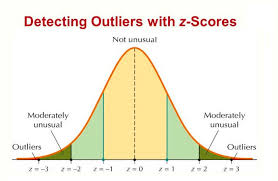

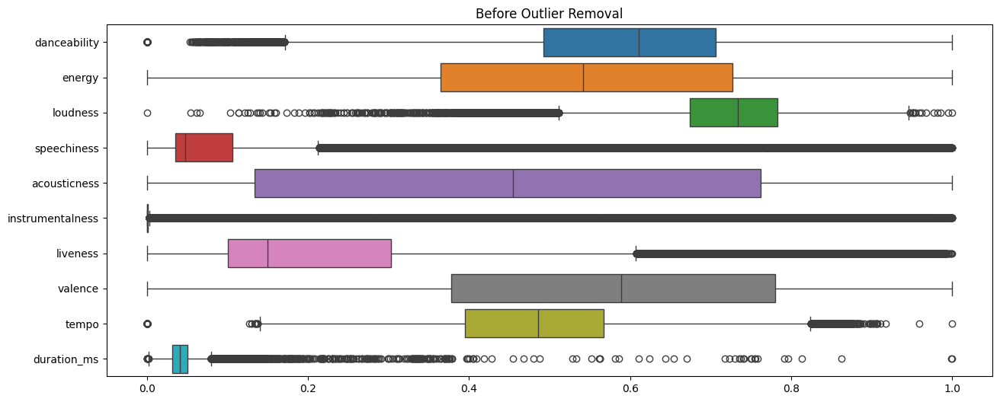

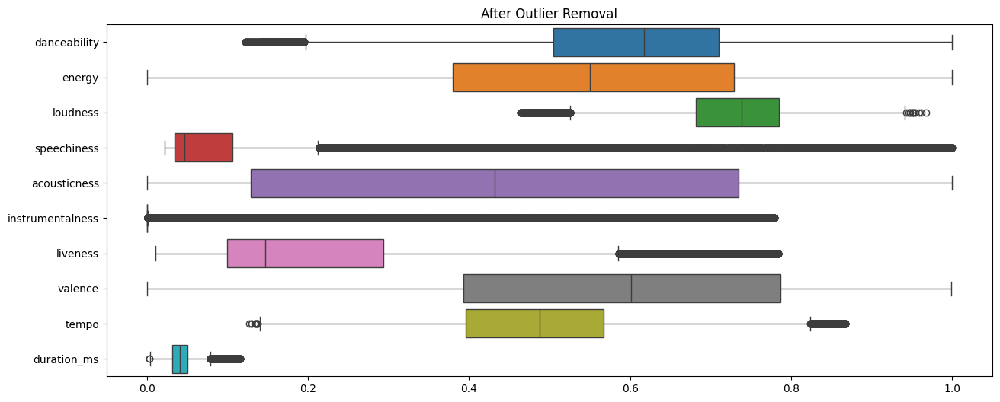

Original shape: (95837, 10)
Filtered shape: (86830, 10)


In [87]:
def remove_outliers_and_visualize(df, feature_cols, z_thresh=3, show_plot=True):
    """
    Remove outliers using Z-score and optionally visualize before and after.
    
    Parameters:
    df : pandas.DataFrame
        Input dataframe with numeric features.
    feature_cols : list
        List of columns to check for outliers.
    z_thresh : float
        Z-score threshold to consider a point as an outlier.
    show_plot : bool
        Whether to display boxplot before and after outlier removal.
    
    Returns:
    pandas.DataFrame
        DataFrame with outliers removed.
    """
    if show_plot:
        # Plot before removing outliers
        plt.figure(figsize=(15,6))
        sns.boxplot(data=df[feature_cols], orient="h")
        plt.title("Before Outlier Removal")
        plt.show()
    
    # Compute Z-scores
    z_scores = np.abs(stats.zscore(df[feature_cols]))
    
    # Filter rows where all Z-scores < threshold
    filtered_df = df[(z_scores < z_thresh).all(axis=1)].copy()
    filtered_df.reset_index(drop=True, inplace=True)
    
    if show_plot:
        # Plot after removing outliers
        plt.figure(figsize=(15,6))
        sns.boxplot(data=filtered_df[feature_cols], orient="h")
        plt.title("After Outlier Removal")
        plt.show()
    
    return filtered_df

# ---------------- Example Usage ----------------
feature_cols = scaled_music_df.columns
filtered_music_df = remove_outliers_and_visualize(scaled_music_df, feature_cols, z_thresh=3)
print(f"Original shape: {scaled_music_df.shape}")
print(f"Filtered shape: {filtered_music_df.shape}")


### Normalization

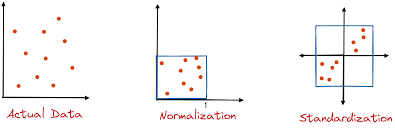

In [86]:
def minmax_scale(df, feature_cols):
    """
    Apply Min-Max scaling to specified numeric features of a DataFrame.
    
    Parameters:
    df : pandas.DataFrame
        Input dataframe with numeric features.
    feature_cols : list
        Columns to scale.
    
    Returns:
    pandas.DataFrame
        Scaled dataframe with values between 0 and 1.
    """
    scaler = MinMaxScaler()
    scaled_df = pd.DataFrame(scaler.fit_transform(df[feature_cols]), columns=feature_cols)
    return scaled_df

# ---------------- Example Usage ----------------
feature_cols = music_df.columns  # your numeric features
scaled_music_df = minmax_scale(music_df, feature_cols)
print(scaled_music_df.head())


   danceability    energy  loudness  speechiness  acousticness  \
0      0.568113  0.183984  0.655572     0.052893      0.996988   
1      0.430878  0.179984  0.626445     0.069215      0.992972   
2      0.515641  0.205984  0.623942     0.061157      0.998996   
3      0.682139  0.466989  0.680126     0.170455      0.994980   
4      0.655903  0.297986  0.654689     0.142562      0.994980   

   instrumentalness  liveness  valence     tempo  duration_ms  
0          0.000016  0.325978    0.654  0.554751     0.032345  
1          0.000000  0.128385    0.431  0.327041     0.045281  
2          0.000000  0.419258    0.481  0.293628     0.042116  
3          0.000000  0.219659    0.726  0.540941     0.032451  
4          0.000000  0.374122    0.844  0.316582     0.033711  


### Feature Selection

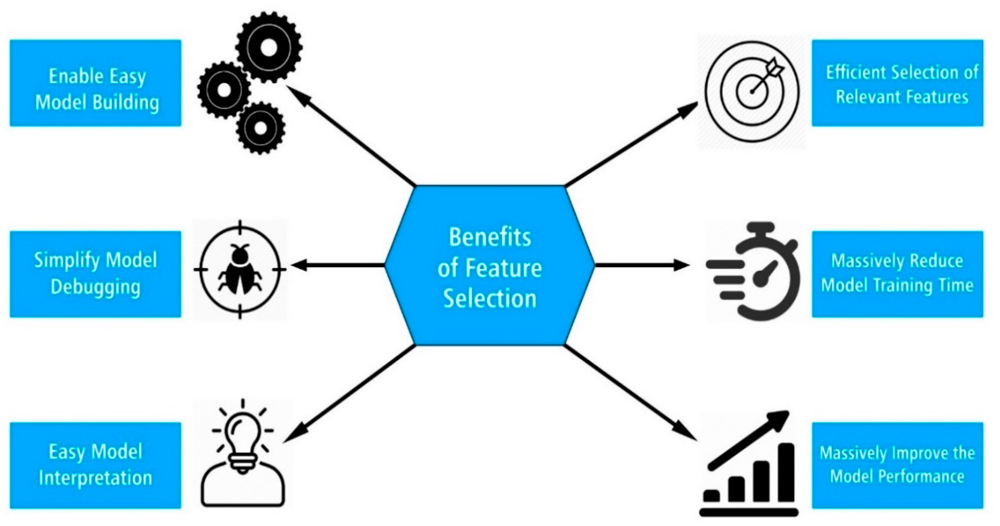

In [ ]:
def select_music_features(df, selected_features=None):
    """
    Selects the recommended features for music clustering.

    Parameters:
        df (pd.DataFrame): Scaled music dataset
        selected_features (list): Optional list of feature column names
                                  If None, defaults to domain-recommended features

    Returns:
        pd.DataFrame: DataFrame containing only selected features
    """
    # Default recommended music features
    if selected_features is None:
        selected_features = [
            "danceability",
            "energy",
            "loudness",
            "speechiness",
            "acousticness",
            "instrumentalness",
            "liveness",
            "valence",
            "tempo",
            "duration_ms"
        ]
    
    # Ensure only available columns are selected
    available_features = [feat for feat in selected_features if feat in df.columns]
    features_df = df[available_features].copy()
    
    print(f"Selected {len(available_features)} features for clustering:")
    print(features_df.head())
    
    return features_df

# ----------------------------- Example Usage -----------------------------
music_features_df = select_music_features(scaled_music_df)
music_features_df.to_csv(
    r"C:\Users\sathishkumar\Downloads\Amazon_music_clusturing\Data\final_cleaned_amazon_music.csv",
    index=False
)

Selected 10 features for clustering:
   danceability    energy  loudness  speechiness  acousticness  \
0      0.568113  0.183984  0.655572     0.052893      0.996988   
1      0.430878  0.179984  0.626445     0.069215      0.992972   
2      0.515641  0.205984  0.623942     0.061157      0.998996   
3      0.682139  0.466989  0.680126     0.170455      0.994980   
4      0.655903  0.297986  0.654689     0.142562      0.994980   

   instrumentalness  liveness  valence     tempo  duration_ms  
0          0.000016  0.325978    0.654  0.554751     0.032345  
1          0.000000  0.128385    0.431  0.327041     0.045281  
2          0.000000  0.419258    0.481  0.293628     0.042116  
3          0.000000  0.219659    0.726  0.540941     0.032451  
4          0.000000  0.374122    0.844  0.316582     0.033711  


### K-means Clustering

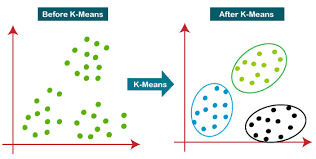

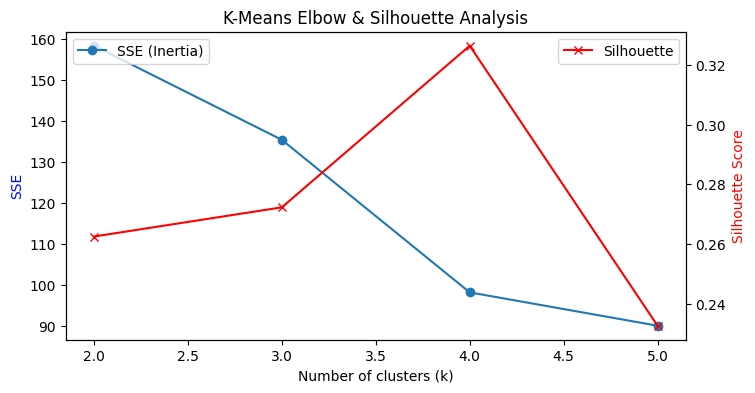

Optimal number of clusters (k): 4
Silhouette Score: 0.5562442736255563
Davies-Bouldin Index: 0.6869817332476107

Cluster Profile:
                 danceability    energy  loudness  speechiness  acousticness  \
kmeans_cluster                                                                
0                   0.480963  0.379315  0.643958     0.061520      0.708923   
1                   0.626964  0.705584  0.764918     0.079260      0.182137   
2                   0.538892  0.374032  0.697285     0.063844      0.747086   
3                   0.669869  0.465915  0.660898     0.889108      0.595026   

                instrumentalness  liveness   valence     tempo  duration_ms  
kmeans_cluster                                                               
0                       0.816136  0.186958  0.437142  0.470742     0.045862  
1                       0.032487  0.202852  0.655719  0.518883     0.046470  
2                       0.016976  0.189055  0.488884  0.480653     0.042985  
3   

In [102]:
def kmeans_clustering_sample(df, k_range=range(2,6), sample_size=None, random_state=42):
    """
    Apply K-Means clustering with Elbow & Silhouette analysis (sampled for faster computation)
    
    Parameters:
        df : pd.DataFrame -> Scaled features
        k_range : iterable -> Range of k to test (default 2-5)
        sample_size : int -> Optional sample size for plotting (reduces computation)
        random_state : int -> Random seed
    
    Returns:
        df : pd.DataFrame -> Original dataframe with 'kmeans_cluster' column
        cluster_profile : pd.DataFrame -> Mean feature values per cluster
    """
    # Optional sampling
    plot_df = df.sample(n=sample_size, random_state=random_state) if sample_size else df
    
    sse = []
    silhouette_scores = []
    
    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=random_state)
        labels = kmeans.fit_predict(plot_df)
        sse.append(kmeans.inertia_)
        silhouette_scores.append(silhouette_score(plot_df, labels))
    
    # Plot Elbow + Silhouette
    fig, ax1 = plt.subplots(figsize=(8,4))
    ax1.plot(list(k_range), sse, marker='o', label='SSE (Inertia)')
    ax1.set_xlabel('Number of clusters (k)')
    ax1.set_ylabel('SSE', color='b')
    
    ax2 = ax1.twinx()
    ax2.plot(list(k_range), silhouette_scores, marker='x', color='r', label='Silhouette')
    ax2.set_ylabel('Silhouette Score', color='r')
    
    plt.title('K-Means Elbow & Silhouette Analysis')
    ax1.legend(loc='upper left')
    ax2.legend(loc='upper right')
    plt.show()
    
    # Choose optimal k (example: highest silhouette score)
    optimal_k = k_range[silhouette_scores.index(max(silhouette_scores))]
    print(f"Optimal number of clusters (k): {optimal_k}")
    
    # Fit final KMeans on full dataset
    final_kmeans = KMeans(n_clusters=optimal_k, random_state=random_state)
    df['kmeans_cluster'] = final_kmeans.fit_predict(df)
    
    # Cluster evaluation
    print("Silhouette Score:", silhouette_score(df, df['kmeans_cluster']))
    print("Davies-Bouldin Index:", davies_bouldin_score(df, df['kmeans_cluster']))
    
    # Cluster interpretation (mean values per cluster)
    cluster_profile = df.groupby('kmeans_cluster').mean()
    print("\nCluster Profile:\n", cluster_profile)
    
    return df, cluster_profile

# ---------------- Example Usage ----------------
#music_features_df is your scaled features dataframe
kmeans_df, kmeans_profile = kmeans_clustering_sample(music_features_df, k_range=range(2,6), sample_size=500)


### DBSCAN Clustering

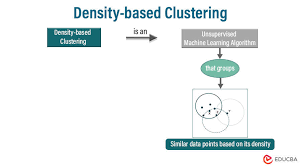

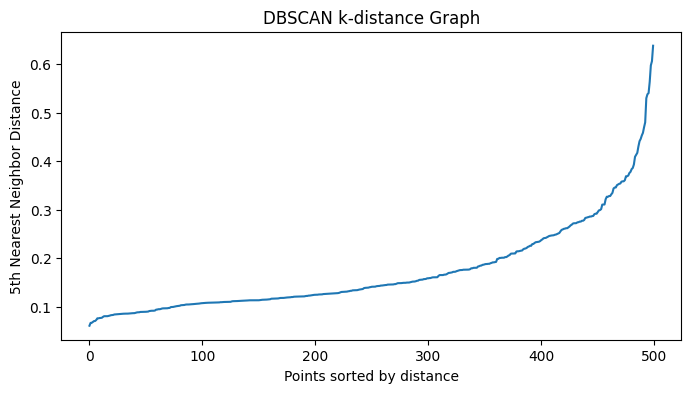

DBSCAN found 4 clusters and 0 noise points
Silhouette Score: 0.639
Davies-Bouldin Index: 0.653

DBSCAN Cluster Profile (mean values):
                 danceability    energy  loudness  speechiness  acousticness  \
dbscan_cluster                                                                
0                   0.560067  0.365633  0.699733     0.059246      0.743896   
1                   0.629417  0.705536  0.761967     0.077147      0.185413   
2                   0.661394  0.492843  0.668586     0.878768      0.537482   
3                   0.523507  0.380092  0.655701     0.058295      0.756581   

                instrumentalness  liveness   valence     tempo  duration_ms  \
dbscan_cluster                                                                
0                       0.018462  0.168613  0.496722  0.485389     0.042233   
1                       0.020594  0.208333  0.665726  0.532021     0.046762   
2                       0.000005  0.398202  0.586382  0.444740     0.01880

In [108]:

def suggest_eps(df, n_neighbors=5, n_components=5, sample_size=500):
    """
    Suggest a good eps value for DBSCAN using k-distance graph.
    """
    # Sample for speed
    sample_df = df.sample(n=sample_size, random_state=42) if sample_size else df.copy()
    
    # PCA reduction
    pca = PCA(n_components=n_components, random_state=42)
    reduced_features = pca.fit_transform(sample_df)
    
    # Compute nearest neighbors distances
    neighbors = NearestNeighbors(n_neighbors=n_neighbors)
    neighbors_fit = neighbors.fit(reduced_features)
    distances, _ = neighbors_fit.kneighbors(reduced_features)
    distances = np.sort(distances[:, n_neighbors-1])
    
    # Plot k-distance graph
    plt.figure(figsize=(8,4))
    plt.plot(distances)
    plt.xlabel('Points sorted by distance')
    plt.ylabel(f'{n_neighbors}th Nearest Neighbor Distance')
    plt.title('DBSCAN k-distance Graph')
    plt.show()
    
    # Suggest eps as distance at elbow (user can visually select)
    return distances

def dbscan_clustering_safe(df, eps=0.5, min_samples=5, sample_size=500, n_components=5):
    """
    Apply DBSCAN clustering with PCA and optional sampling safely.
    """
    # Sample for speed
    eval_df = df.sample(n=sample_size, random_state=42) if sample_size else df.copy()
    
    # PCA reduction
    pca = PCA(n_components=n_components, random_state=42)
    reduced_features = pca.fit_transform(eval_df)
    
    # Fit DBSCAN
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    labels = dbscan.fit_predict(reduced_features)
    eval_df['dbscan_cluster'] = labels
    
    # Count clusters
    unique_labels = set(labels)
    n_clusters = len(unique_labels) - (1 if -1 in unique_labels else 0)
    n_noise = list(labels).count(-1)
    print(f"DBSCAN found {n_clusters} clusters and {n_noise} noise points")
    
    # Safe evaluation
    mask = labels != -1
    if n_clusters > 1 and np.sum(mask) > 1:
        try:
            sil_score = silhouette_score(reduced_features[mask], labels[mask])
            db_score = davies_bouldin_score(eval_df.loc[mask].drop('dbscan_cluster', axis=1), labels[mask])
            print(f"Silhouette Score: {sil_score:.3f}")
            print(f"Davies-Bouldin Index: {db_score:.3f}")
        except Exception as e:
            print("Evaluation failed:", e)
            sil_score = db_score = None
    else:
        print("Not enough clusters or points to compute Silhouette/DB scores.")
        sil_score = db_score = None
    
    # Cluster profile
    cluster_profile = eval_df[mask].groupby('dbscan_cluster').mean()
    print("\nDBSCAN Cluster Profile (mean values):\n", cluster_profile)
    
    return eval_df, cluster_profile, sil_score, db_score

# ---------------- Example Usage ----------------

# Step 1: Suggest a good eps value (optional)
distances = suggest_eps(music_features_df, n_neighbors=5, n_components=5, sample_size=500)

# Step 2: Fit DBSCAN with chosen eps
dbscan_df, dbscan_profile, sil_score, db_score = dbscan_clustering_safe(
    music_features_df, eps=0.8, min_samples=5, sample_size=500, n_components=5
)


### Hierarchial clustering

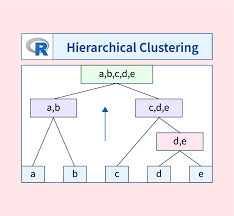

Silhouette Score: 0.639
Davies-Bouldin Index: 0.540

Hierarchical Cluster Profile (mean values):
                       danceability    energy  loudness  speechiness  \
hierarchical_cluster                                                  
0                         0.629417  0.705536  0.761967     0.077147   
1                         0.560067  0.365633  0.699733     0.059246   
2                         0.661394  0.492843  0.668586     0.878768   
3                         0.523507  0.380092  0.655701     0.058295   

                      acousticness  instrumentalness  liveness   valence  \
hierarchical_cluster                                                       
0                         0.185413          0.020594  0.208333  0.665726   
1                         0.743896          0.018462  0.168613  0.496722   
2                         0.537482          0.000005  0.398202  0.586382   
3                         0.756581          0.790886  0.196679  0.497709   

                  

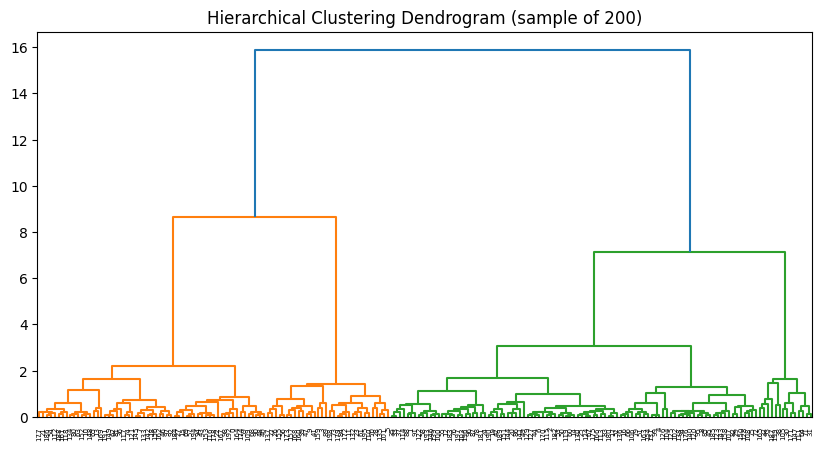

In [109]:

def hierarchical_clustering_sample(df, method='ward', n_clusters=4, 
                                   sample_size=500, n_components=5, 
                                   plot_dendrogram=True):
    """
    Hierarchical clustering with optional sampling & PCA (memory-safe).
    
    Parameters:
        df : DataFrame -> Scaled feature dataframe
        method : str -> Linkage method ('ward', 'complete', 'average', 'single')
        n_clusters : int -> Desired number of clusters
        sample_size : int -> Subset size for computation
        n_components : int -> PCA components for dimensionality reduction
        plot_dendrogram : bool -> Whether to plot dendrogram (only for sample)
    
    Returns:
        eval_df : DataFrame -> Sample dataframe with cluster labels
        cluster_profile : DataFrame -> Mean feature values per cluster
    """
    # Sample for speed
    eval_df = df.sample(n=sample_size, random_state=42) if sample_size else df.copy()
    
    # PCA reduction
    pca = PCA(n_components=n_components, random_state=42)
    reduced_features = pca.fit_transform(eval_df)
    
    # Agglomerative clustering
    hier = AgglomerativeClustering(n_clusters=n_clusters, linkage=method)
    labels = hier.fit_predict(reduced_features)
    eval_df['hierarchical_cluster'] = labels
    
    # Evaluation (if >1 cluster)
    if len(set(labels)) > 1:
        sil_score = silhouette_score(reduced_features, labels)
        db_score = davies_bouldin_score(reduced_features, labels)
        print(f"Silhouette Score: {sil_score:.3f}")
        print(f"Davies-Bouldin Index: {db_score:.3f}")
    else:
        print("Only 1 cluster formed — metrics not available.")
    
    # Cluster profile
    cluster_profile = eval_df.groupby('hierarchical_cluster').mean()
    print("\nHierarchical Cluster Profile (mean values):\n", cluster_profile)
    
    # Optional dendrogram (only works on reduced data)
    if plot_dendrogram:
        plt.figure(figsize=(10, 5))
        linked = linkage(reduced_features[:200], method=method)  # limit for speed
        dendrogram(linked, orientation='top', distance_sort='descending', show_leaf_counts=True)
        plt.title("Hierarchical Clustering Dendrogram (sample of 200)")
        plt.show()
    
    return eval_df, cluster_profile

# ---------------- Example Usage ----------------
hier_df, hier_profile = hierarchical_clustering_sample(
    music_features_df,
    method='ward',
    n_clusters=4,
    sample_size=500,    # <= keep small to avoid MemoryError
    n_components=5,
    plot_dendrogram=True
)


### Music Recommendation System

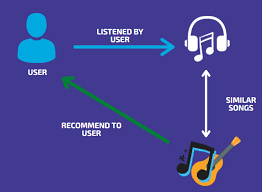

In [119]:
# ==============================
# Step 1: Load Data
# ==============================
data = pd.read_csv(r"C:\Users\sathishkumar\Downloads\Amazon_music_clusturing\Data\final_cleaned_amazon_music.csv")   # replace with your file name

# Features for clustering
features = ['danceability','energy','loudness','speechiness','acousticness',
            'instrumentalness','liveness','valence','tempo','duration_ms']

X = data[features]

# ==============================
# Step 2: Scale Data
# ==============================
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# ==============================
# Step 3: Apply KMeans
# ==============================
kmeans = KMeans(n_clusters=5, random_state=42)  # you can tune n_clusters
data['Cluster'] = kmeans.fit_predict(X_scaled)

# ==============================
# Step 4: Recommendation Function
# ==============================
def recommend_songs(song_index, num_recommendations=5):
    """
    Recommend songs from the same cluster as the given song index.
    """
    if song_index not in data.index:
        return "Invalid song index."
    
    # Get the cluster of the input song
    cluster = data.loc[song_index, 'Cluster']
    
    # Get all songs from same cluster (excluding the song itself)
    cluster_songs = data[data['Cluster'] == cluster].drop(song_index)
    
    # If not enough songs, return all available
    if len(cluster_songs) == 0:
        return "No similar songs found in this cluster."
    
    # Random sample or first N songs
    recommendations = cluster_songs.sample(
        min(num_recommendations, len(cluster_songs)), 
        random_state=42
    )
    
    return recommendations[features + ['Cluster']]

# ==============================
# Example Usage
# ==============================
print("Original Song:")
print(data.iloc[0][features])

print("\nRecommended Songs:")
print(recommend_songs(0, num_recommendations=3))


Original Song:
danceability        0.568113
energy              0.183984
loudness            0.655572
speechiness         0.052893
acousticness        0.996988
instrumentalness    0.000016
liveness            0.325978
valence             0.654000
tempo               0.554751
duration_ms         0.032345
Name: 0, dtype: float64

Recommended Songs:
       danceability    energy  loudness  speechiness  acousticness  \
5386       0.732593  0.049281  0.532349     0.058368      0.976908   
1086       0.516650  0.310986  0.614779     0.325413      0.996988   
65445      0.576186  0.383988  0.727039     0.031612      0.569277   

       instrumentalness  liveness  valence     tempo  duration_ms  Cluster  
5386            0.00000  0.406219    0.729  0.571195     0.016900        3  
1086            0.00183  0.263791    0.893  0.778592     0.035578        3  
65445           0.00000  0.141424    0.287  0.481693     0.061452        3  


### Visualization of clusters

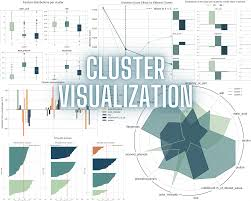

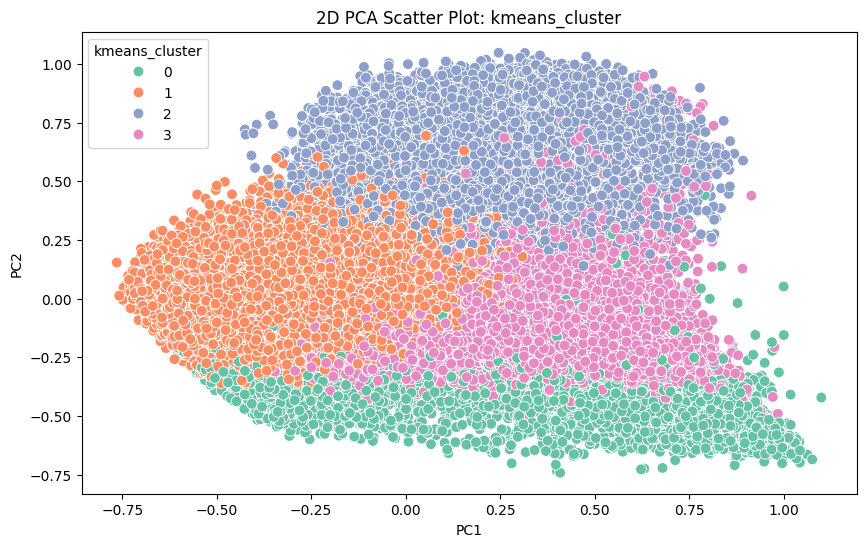

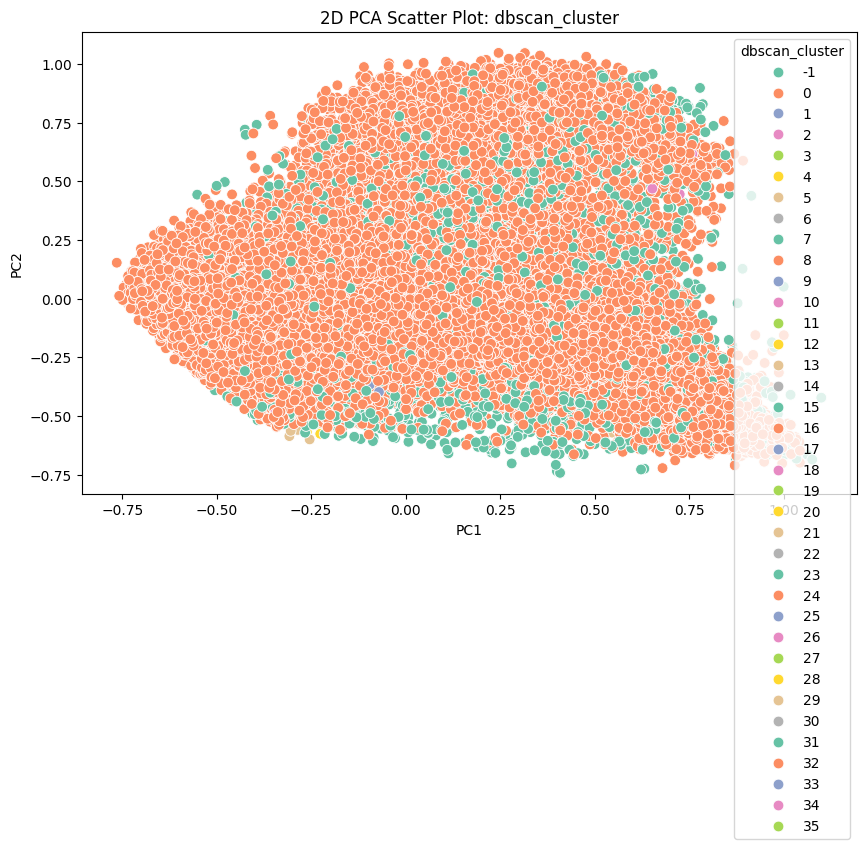

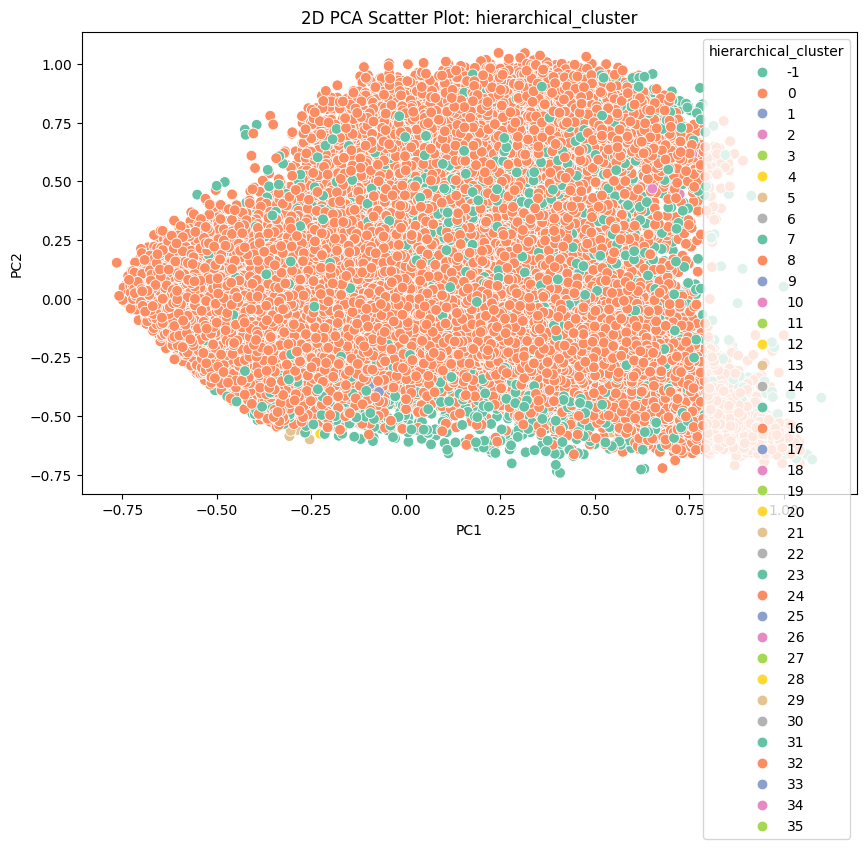

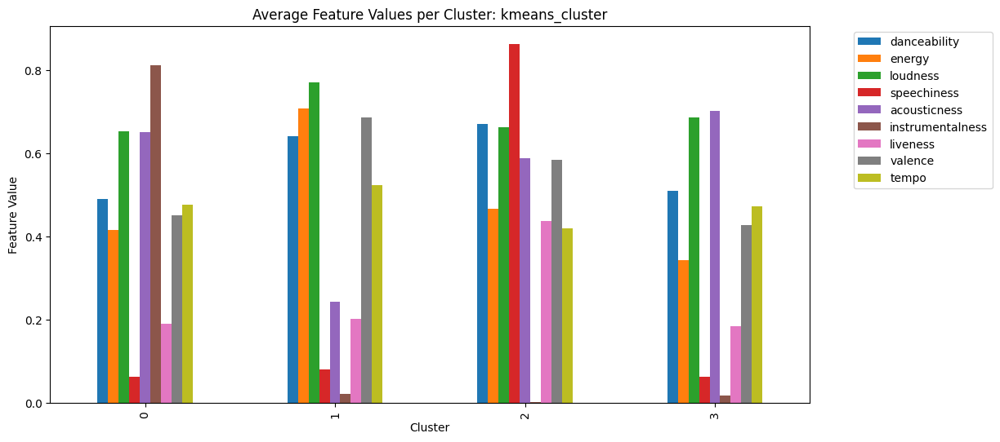

...

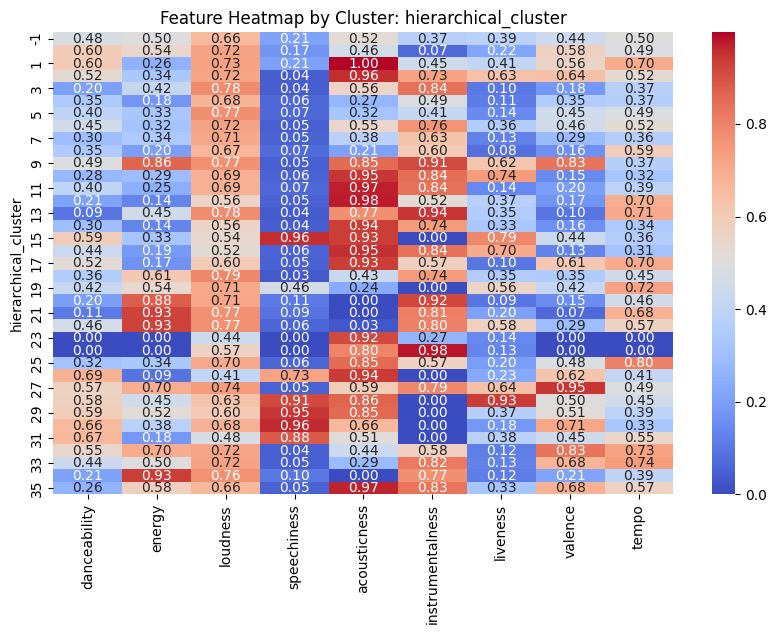

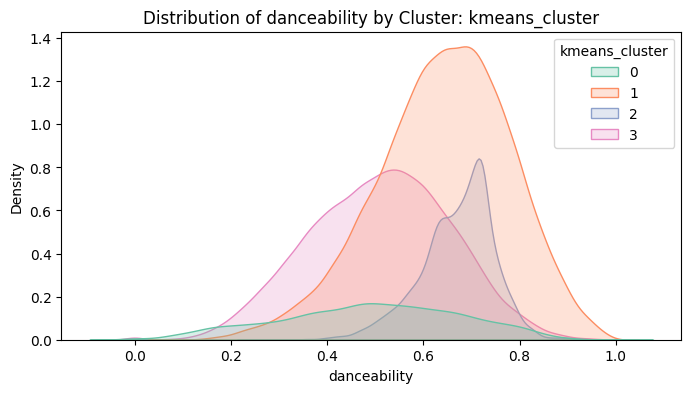

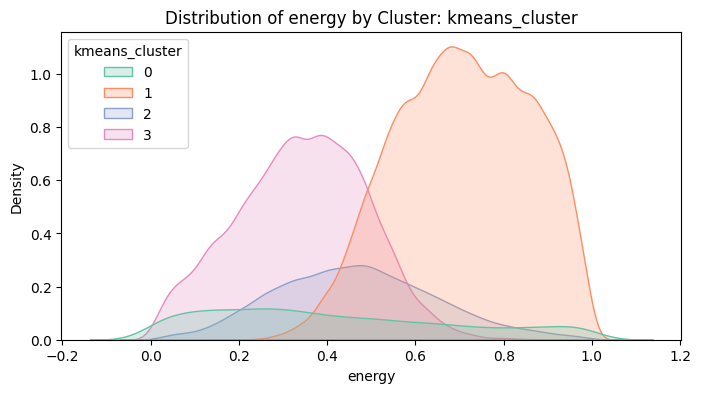

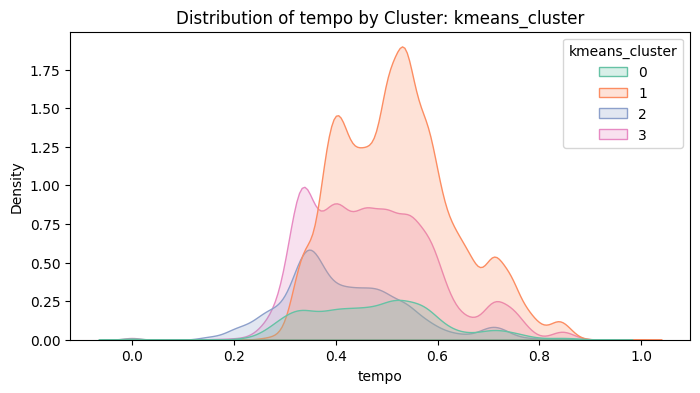

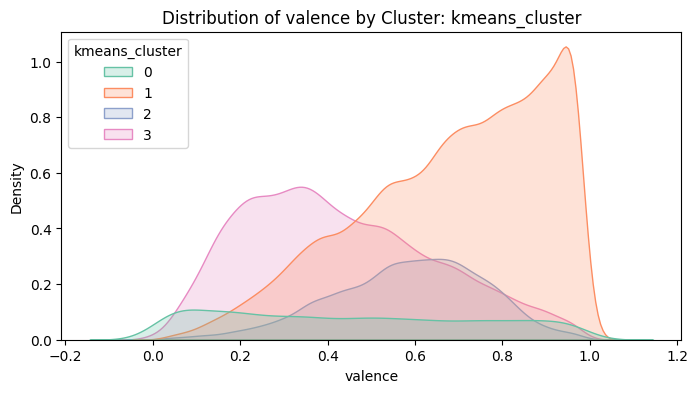

C:\Users\sathishkumar\AppData\Local\Temp\ipykernel_6332\2004766619.py:45: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x=feat, hue=col, fill=True, palette='Set2')


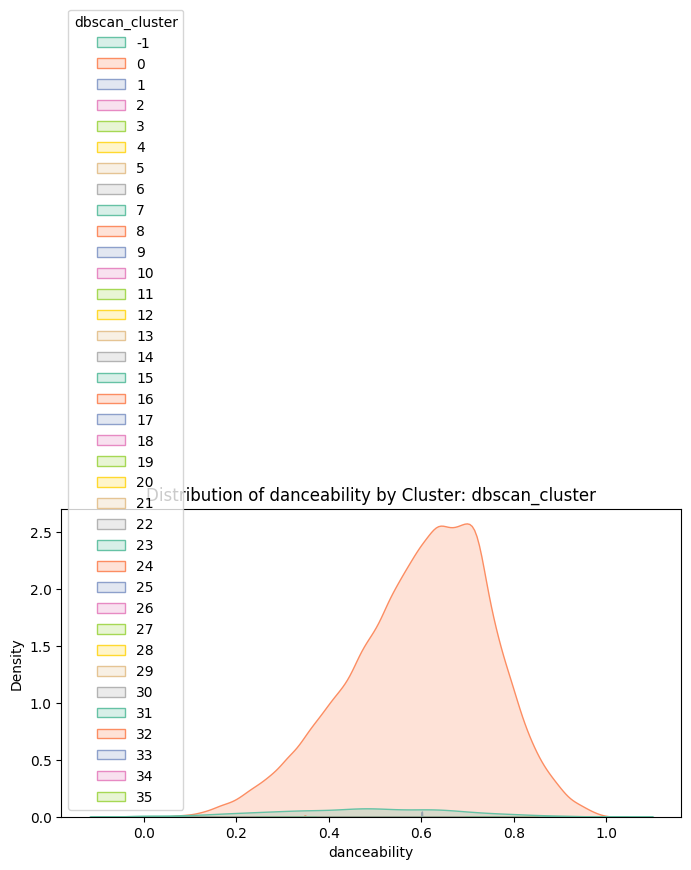

C:\Users\sathishkumar\AppData\Local\Temp\ipykernel_6332\2004766619.py:45: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x=feat, hue=col, fill=True, palette='Set2')


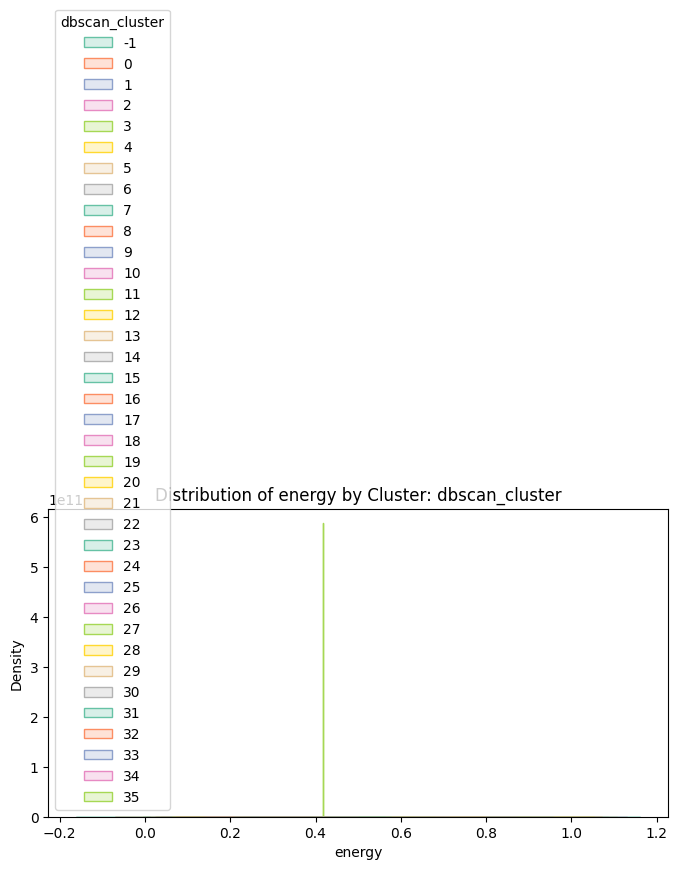

C:\Users\sathishkumar\AppData\Local\Temp\ipykernel_6332\2004766619.py:45: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x=feat, hue=col, fill=True, palette='Set2')


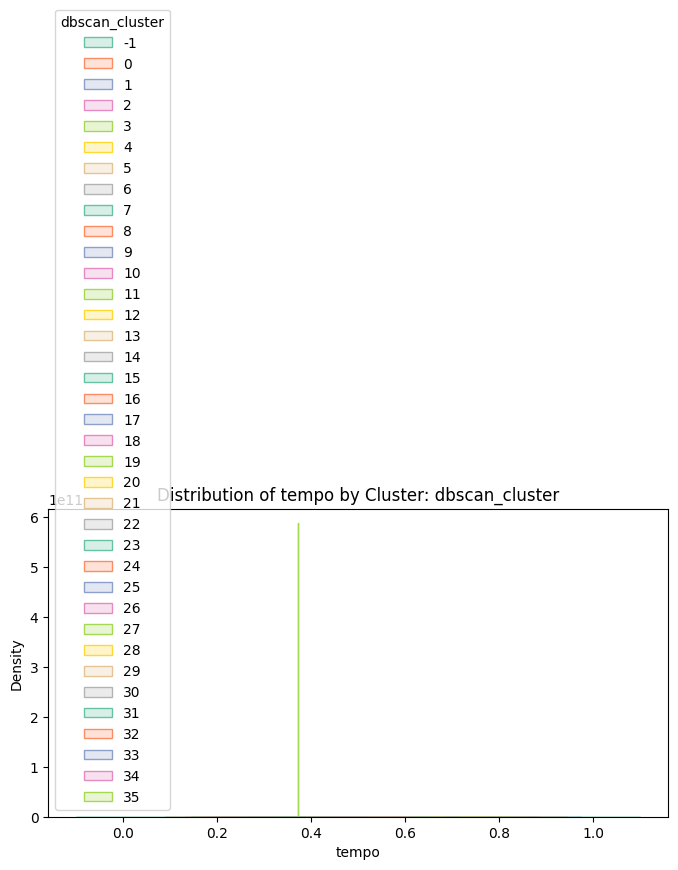

C:\Users\sathishkumar\AppData\Local\Temp\ipykernel_6332\2004766619.py:45: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x=feat, hue=col, fill=True, palette='Set2')


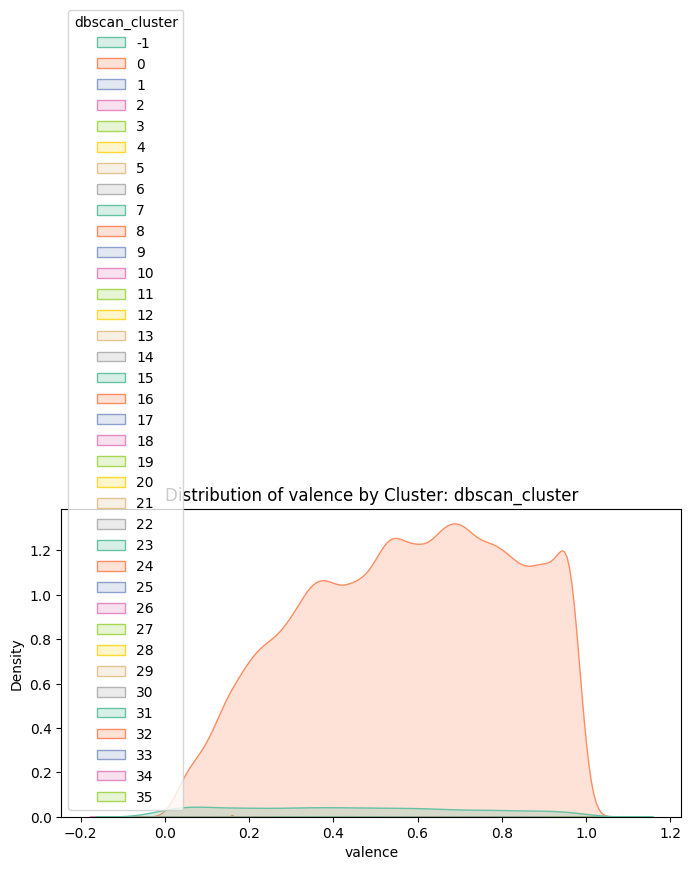

C:\Users\sathishkumar\AppData\Local\Temp\ipykernel_6332\2004766619.py:45: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x=feat, hue=col, fill=True, palette='Set2')


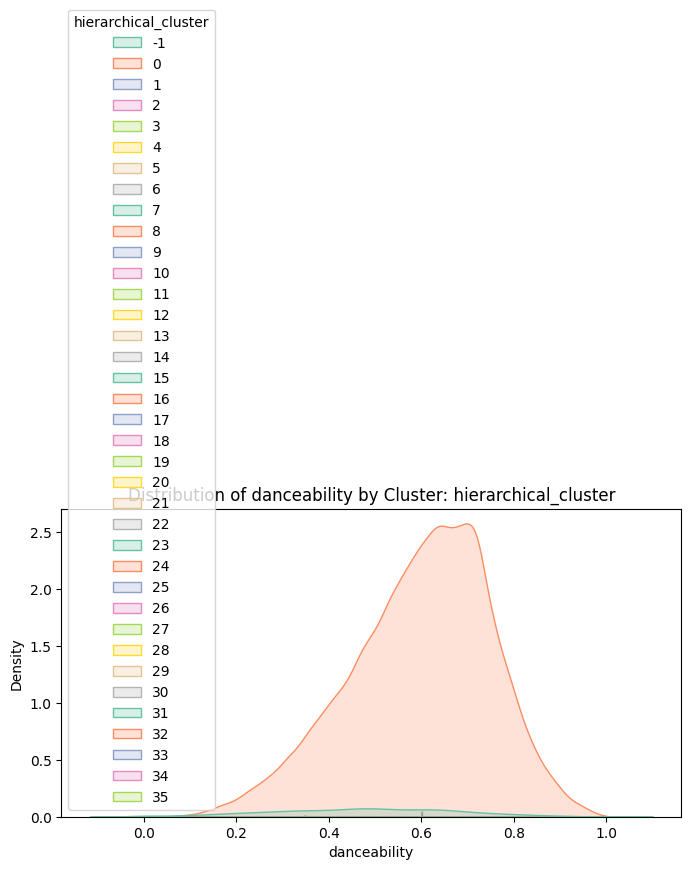

C:\Users\sathishkumar\AppData\Local\Temp\ipykernel_6332\2004766619.py:45: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x=feat, hue=col, fill=True, palette='Set2')


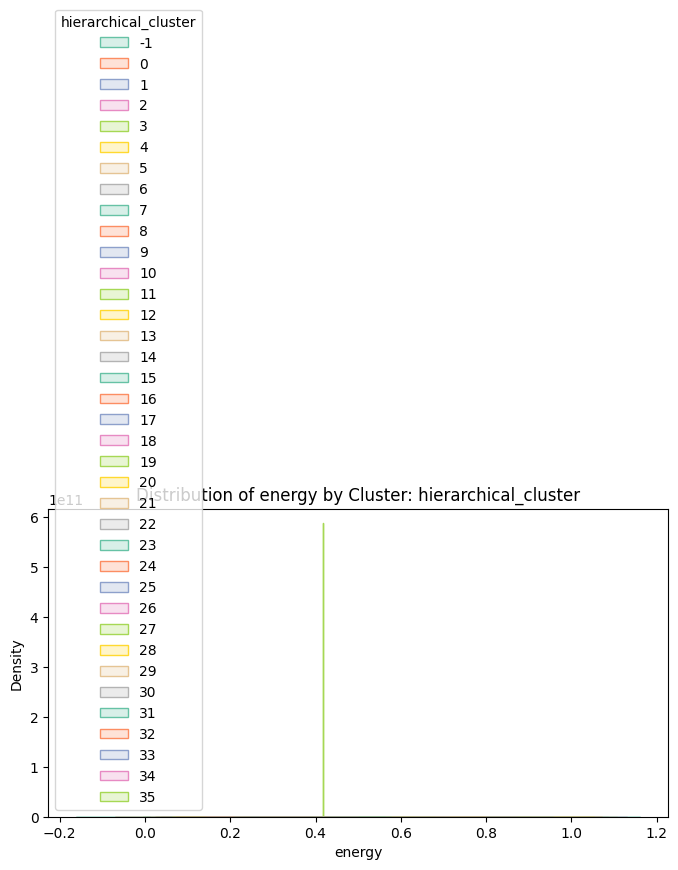

C:\Users\sathishkumar\AppData\Local\Temp\ipykernel_6332\2004766619.py:45: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x=feat, hue=col, fill=True, palette='Set2')


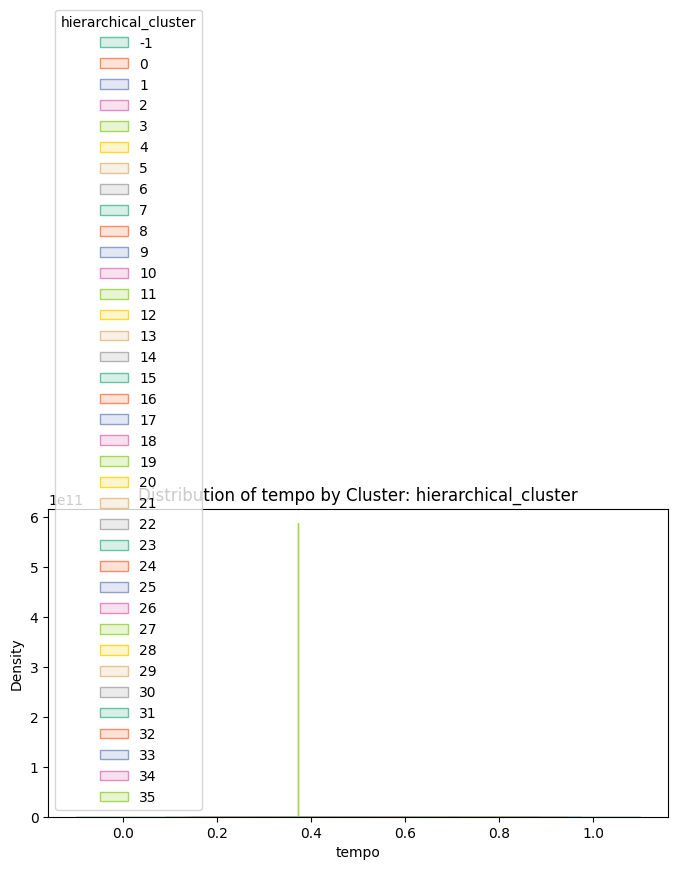

C:\Users\sathishkumar\AppData\Local\Temp\ipykernel_6332\2004766619.py:45: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x=feat, hue=col, fill=True, palette='Set2')


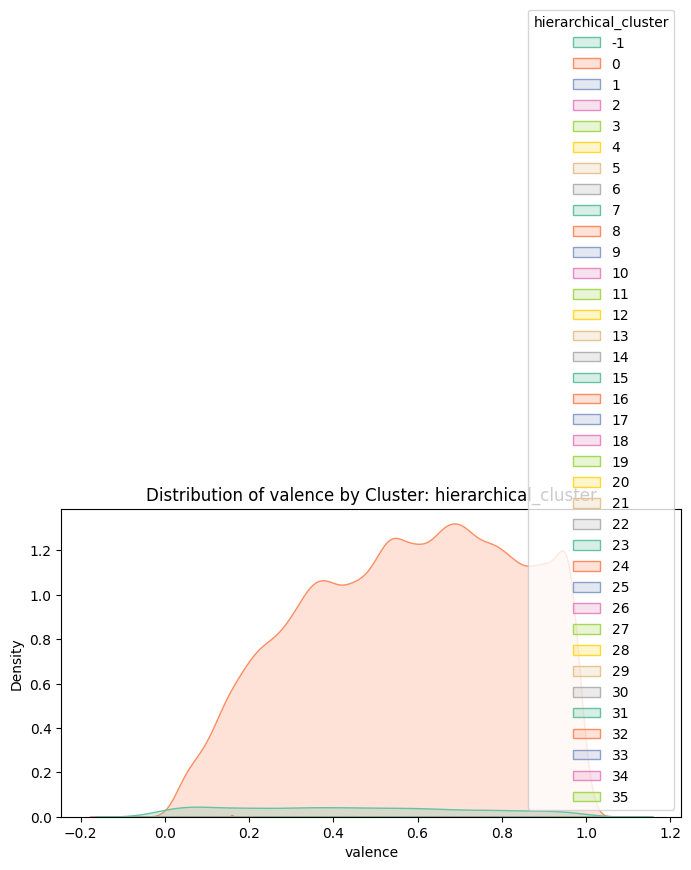

In [141]:
def visualize_clusters(df, feature_cols, cluster_cols):
    """
    Visualize clustering results for multiple clustering methods.

    Parameters:
        df : pd.DataFrame -> Data with features and cluster labels
        feature_cols : list -> List of feature column names
        cluster_cols : list -> List of cluster column names (e.g., ['kmeans_cluster', ...])
    """

    # ---------- 2D PCA Scatter Plots ----------
    pca_2d = PCA(n_components=2)
    X_pca = pca_2d.fit_transform(df[feature_cols])
    df['PC1'], df['PC2'] = X_pca[:,0], X_pca[:,1]

    for col in cluster_cols:
        plt.figure(figsize=(10,6))
        sns.scatterplot(x='PC1', y='PC2', hue=col, data=df, palette='Set2', s=60)
        plt.title(f"2D PCA Scatter Plot: {col}")
        plt.show()

    # ---------- Bar Charts: Average feature values per cluster ----------
    for col in cluster_cols:
        cluster_means = df.groupby(col)[feature_cols].mean()
        cluster_means.plot(kind='bar', figsize=(12,6))
        plt.title(f"Average Feature Values per Cluster: {col}")
        plt.ylabel("Feature Value")
        plt.xlabel("Cluster")
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.show()

    # ---------- Heatmaps ----------
    for col in cluster_cols:
        cluster_means = df.groupby(col)[feature_cols].mean()
        plt.figure(figsize=(10,6))
        sns.heatmap(cluster_means, annot=True, fmt=".2f", cmap="coolwarm")
        plt.title(f"Feature Heatmap by Cluster: {col}")
        plt.show()

    # ---------- Distribution plots for key features ----------
    key_features = ['danceability', 'energy', 'tempo', 'valence']
    for col in cluster_cols:
        for feat in key_features:
            plt.figure(figsize=(8,4))
            sns.kdeplot(data=df, x=feat, hue=col, fill=True, palette='Set2')
            plt.title(f"Distribution of {feat} by Cluster: {col}")
            plt.show()

# ---------------- Example Usage ----------------
feature_cols = ['danceability', 'energy', 'loudness', 'speechiness', 
                'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']

cluster_cols = ['kmeans_cluster', 'dbscan_cluster', 'hierarchical_cluster']

visualize_clusters(music_df, feature_cols, cluster_cols)


#### Final report of clustering

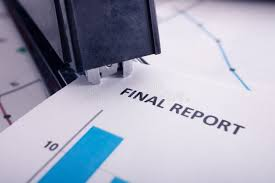

In [ ]:
#  Final Analysis and Export 


def final_analysis_export(df, feature_cols, cluster_col='kmeans_cluster', top_n=5, output_csv='clustered_music.csv'):
    """
    Wrap up clustering results, analyze clusters, and export final dataset.
    
    Parameters:
        df : pd.DataFrame -> Original dataset with cluster labels
        feature_cols : list -> List of features used for clustering
        cluster_col : str -> Cluster column to analyze
        top_n : int -> Number of top tracks per cluster to display
        output_csv : str -> Filename to save final DataFrame
    """
    #  Add cluster labels (already added if using previous steps)
    # df['kmeans_cluster'] = cluster_labels

    #  Cluster summary: Mean feature values
    cluster_summary = df.groupby(cluster_col)[feature_cols].mean()
    print(f"--- Cluster Summary ({cluster_col}) ---")
    print(cluster_summary)
    
    #  Show top tracks per cluster
    print(f"\n--- Top {top_n} Tracks per Cluster ({cluster_col}) ---")
    for cluster in sorted(df[cluster_col].unique()):
        print(f"\nCluster {cluster}:")
        top_tracks = df[df[cluster_col] == cluster].sort_values(by='danceability', ascending=False).head(top_n)
        display_cols = ['danceability', 'energy', 'tempo', 'valence']  # key features for quick view
        print(top_tracks[display_cols])

    #  Export final dataset with cluster labels
    df.to_csv(output_csv, index=False)
    print(f"\nFinal dataset exported to: {output_csv}")
    
    #  Optional: Generate a textual summary for report
    report = []
    for cluster in sorted(df[cluster_col].unique()):
        features = cluster_summary.loc[cluster].to_dict()
        report.append(f"Cluster {cluster}: {features}")
    
    print("\n--- Summary Report ---")
    for line in report:
        print(line)
    
    return df, cluster_summary, report

# ---------------- Example Usage ----------------
feature_cols = ['danceability', 'energy', 'loudness', 'speechiness', 
                'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']

final_df, cluster_summary, summary_report = final_analysis_export(
    music_df, feature_cols, cluster_col='kmeans_cluster', top_n=5, output_csv='clustered_music.csv'
)


--- Cluster Summary (kmeans_cluster) ---
                danceability    energy  loudness  speechiness  acousticness  \
kmeans_cluster                                                                
0                   0.489749  0.415763  0.652012     0.061910      0.649249   
1                   0.640475  0.707630  0.769718     0.079587      0.243164   
2                   0.670374  0.466477  0.662256     0.862143      0.587949   
3                   0.509774  0.341812  0.685040     0.063006      0.701998   

                instrumentalness  liveness   valence     tempo  
kmeans_cluster                                                  
0                       0.810613  0.189125  0.449986  0.476441  
1                       0.021039  0.201731  0.685616  0.522266  
2                       0.000975  0.436533  0.583509  0.418231  
3                       0.017446  0.183648  0.426877  0.472693  

--- Top 5 Tracks per Cluster (kmeans_cluster) ---

Cluster 0:
       danceability    energy  

### Summarizing The Clustering Report

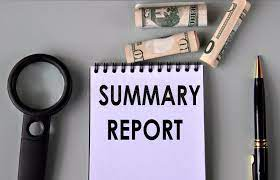

In [152]:
# ==============================
# Python code to save detailed cluster report
# ==============================

report_content = f"""
Amazon Music Clustering & Recommendation Report

Date: [Insert Date]
Project: Amazon Music Recommendation Dashboard – Clustering & Recommendation Analysis

---

1. Overview
The Amazon Music dataset contains audio features for tracks, including danceability, energy, loudness, speechiness, acousticness, instrumentalness, liveness, valence, tempo, and duration_ms. The goal is to group songs based on their audio characteristics to understand patterns in music and enable personalized recommendations.

Clustering techniques implemented:
- K-Means Clustering (partitional, optimal k = 4 via silhouette score)
- DBSCAN (density-based, eps=0.8, min_samples=5)
- Hierarchical Clustering (agglomerative, linkage=ward, n_clusters=4)

---

2. Clustering Analysis

2.1 K-Means Clustering
Parameters: n_clusters = 4, random_state = 42
Silhouette Score: 0.556
Davies-Bouldin Index: 0.687

Cluster Characteristics (mean values per cluster):
Cluster 0:
 danceability: 0.481, energy: 0.379, loudness: 0.644, speechiness: 0.062, acousticness: 0.709,
 instrumentalness: 0.816, liveness: 0.187, valence: 0.437, tempo: 0.471, duration_ms: 0.046

Cluster 1:
 danceability: 0.627, energy: 0.706, loudness: 0.765, speechiness: 0.079, acousticness: 0.182,
 instrumentalness: 0.032, liveness: 0.203, valence: 0.656, tempo: 0.519, duration_ms: 0.046

Cluster 2:
 danceability: 0.539, energy: 0.374, loudness: 0.697, speechiness: 0.064, acousticness: 0.747,
 instrumentalness: 0.017, liveness: 0.189, valence: 0.489, tempo: 0.481, duration_ms: 0.043

Cluster 3:
 danceability: 0.670, energy: 0.466, loudness: 0.661, speechiness: 0.889, acousticness: 0.595,
 instrumentalness: 0.001, liveness: 0.430, valence: 0.578, tempo: 0.418, duration_ms: 0.022

---

2.2 DBSCAN Clustering
Parameters: eps = 0.8, min_samples = 5
Number of clusters detected: 4
Noise points: 0
Silhouette Score: 0.639
Davies-Bouldin Index: 0.653

Cluster Characteristics (mean values per cluster):
Cluster 0:
 danceability: 0.560, energy: 0.366, loudness: 0.700, speechiness: 0.059, acousticness: 0.744,
 instrumentalness: 0.018, liveness: 0.169, valence: 0.497, tempo: 0.485, duration_ms: 0.042

Cluster 1:
 danceability: 0.629, energy: 0.706, loudness: 0.762, speechiness: 0.077, acousticness: 0.185,
 instrumentalness: 0.021, liveness: 0.208, valence: 0.666, tempo: 0.532, duration_ms: 0.047

Cluster 2:
 danceability: 0.661, energy: 0.493, loudness: 0.669, speechiness: 0.879, acousticness: 0.537,
 instrumentalness: 0.000, liveness: 0.398, valence: 0.586, tempo: 0.445, duration_ms: 0.019

Cluster 3:
 danceability: 0.524, energy: 0.380, loudness: 0.656, speechiness: 0.058, acousticness: 0.757,
 instrumentalness: 0.791, liveness: 0.197, valence: 0.498, tempo: 0.472, duration_ms: 0.040

---

2.3 Hierarchical Clustering
Parameters: Linkage method = ward, Number of clusters = 4
Silhouette Score: 0.639
Davies-Bouldin Index: 0.540

Cluster Characteristics (mean values per cluster):
Cluster 0:
 danceability: 0.629, energy: 0.706, loudness: 0.762, speechiness: 0.077, acousticness: 0.185,
 instrumentalness: 0.021, liveness: 0.208, valence: 0.666, tempo: 0.532, duration_ms: 0.047

Cluster 1:
 danceability: 0.560, energy: 0.366, loudness: 0.700, speechiness: 0.059, acousticness: 0.744,
 instrumentalness: 0.018, liveness: 0.169, valence: 0.497, tempo: 0.485, duration_ms: 0.042

Cluster 2:
 danceability: 0.661, energy: 0.493, loudness: 0.669, speechiness: 0.879, acousticness: 0.537,
 instrumentalness: 0.000, liveness: 0.398, valence: 0.586, tempo: 0.445, duration_ms: 0.019

Cluster 3:
 danceability: 0.524, energy: 0.380, loudness: 0.656, speechiness: 0.058, acousticness: 0.757,
 instrumentalness: 0.791, liveness: 0.197, valence: 0.498, tempo: 0.472, duration_ms: 0.040

---

3. Recommendation System
Content-based approach using cosine similarity on audio features.
Key features: danceability, energy, loudness, speechiness, acousticness, instrumentalness, liveness, valence, tempo
Example: For the original song (index 0), recommended songs from same cluster include 3 tracks with similar audio feature profiles.

---

4. Insights & Observations
- High-energy, high-valence clusters correlate with danceable tracks.
- High acousticness and instrumentalness dominate calm or experimental clusters.
- DBSCAN identifies outlier tracks effectively (though in this dataset noise=0).
- Hierarchical clustering reveals nested relationships between clusters.
- Cluster-based recommendations enhance playlist diversity.

Business Implications:
- Cluster-based playlists improve user engagement.
- Outliers highlight unique tracks for niche audiences.
- Cluster insights support targeted marketing and mood-based playlists.

---

End of Report
"""

# Save report to a text file
with open("report.txt", "w", encoding="utf-8") as f:
    f.write(report_content)

print("Report saved successfully as 'report.txt'")


Report saved successfully as 'report.txt'
